In [638]:
# Import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor 

import folium
import folium.vector_layers
import geopandas as gpd

import warnings
warnings.filterwarnings("ignore")

In [639]:
# Load dataset
data = pd.read_csv('data_california_house.csv')

In [640]:
def despine(ax):
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    return ax

# **CALIFORNIA HOUSING PRICE**


---
### **1.** ***BUSINESS PROBLEM UNDERSTANDING***
**Context**

Di pasar *real estate* California yang sangat kompetitif, hubungan antara agen *real estate* dan calon pembeli menjadi sangat penting. Agen *real estate* memiliki peran untuk membimbing calon pembeli rumah dalam proses pembelian rumah melalui tahapan yang kompleks. Sebagai salah satu contoh, agen *real estate* diharuskan untuk membantu calon pembeli mengidentifikasi properti yang sesuai dengan kebutuhan dan anggaran yang ada.

Pasar perumahan di California terkenal memiliki harga yang tinggi serta persaingan penjualan yang kompetitif. Sejak tahun 1970, harga rumah di California sendiri memiliki perbedaan yang sangat signifikan dibanding dengan negara bagian lainnya. Pada tahun yang sama, harga rumah di California meningkat dari 30% diatas rata-rata nasional menjadi lebih dari 80% lebih tinggi. Kondisi tersebut menyebabkan tantangan besar baik bagi pembeli maupun penjual. Peningkatan harga tersebut disebabkan oleh beberapa faktor, seperti peminatan yang melunjak, pasokan yang terbatas, serta kondisi ekonomi California yang kuat. Bagi calon pembeli, memahami kondisi pasar rumah tersebut sangatlah penting. Agen *real estate* diharuskan untuk memiliki pengetahuan mendalam terkait kondisi tersebut untuk dapat membimbing calon pembeli secara efektif.

Salah satu tolak ukur dalam proses tersebut adalah median nilai rumah. Nilai tersebut menggambarkan harga rumah di suatu area tertentu. Bagi pembeli, metrik tersebut sangatlah penting dalam menilai apakah suatu rumah memiliki harga yang wajar. Perusahaan *real estate* diharuskan untuk seakurat mungkin dalam menentukan nilai tersebut agar nilai yang didapat dapat tetap kompetitif serta menarik calon pembeli bersamaan dengan memenuhi standar yang ditetapkan oleh penjual rumah. Median nilai rumah tersebut berfungsi sebagai tolak ukur yang dapat membantu pembeli dan penjual untuk membuat keputusan yang tepat.

*sources:* 
- *[California's High Housing Cost](https://lao.ca.gov/reports/2015/finance/housing-costs/housing-costs.pdf)*
- *[National Association of Realtors](https://www.nar.realtor/)*

**Problem Statement**

Perusahaan *real estate* di California menghadapi tantangan besar dalam menentukan nilai rumah dengan akurat di pasar yang dinamis dan sangat kompetitif untuk kemudian digunakan dalam penentuan harga rumah. Selain itu, diperlukan perhitungan nilai rumah dengan akurat sehingga tidak terjadi kerugian atau hilangnya keuntungan saat menentukan nilai jual rumah. Penetapan nilai rumah yang terlalu tinggi dapat menyebabkan properti tidak laku dan terjual dalam waktu yang lama. Sebaliknya, penetapan nilai rumah yang terlalu rendah dapat menyebabkan keuntungan yang menurun. **Dalam lingkungan pasar yang berkembang pesat ini, perusahaan *real estate* membutuhkan model prediksi yang sesuai untuk memperkirakan nilai rumah dengan akurasi tinggi guna mengoptimalkan strategi penetapan harga, meningkatkan efisiensi penjualan, dan memaksimalkan laba atas investasi.**

**Goals**

Berdasarkan permasalahan tersebut, perusahaan *real estate* diharuskan untuk memiliki suatu 'alat' yang dapat membantu dalam **memprediksi median nilai rumah di California** dengan akurat. Adanya perbedaan fitur seperti lokasi geografis, karakteristik rumah, serta kondisi ekonomi dapat menambah tingkat akurasi dalam menentukan median nilai rumah di California. Selain itu, diperlukan juga pemahaman mengenai **aspek penting apa saja yang dapat mempengaruhi median nilai rumah di California**

Penyusunan model ini diharapkan dapat menjadi suatu alat dalam menentukan strategi penentuan harga awal suatu rumah berdasarkan kompleks dari rumah tersebut dengan akurat. Hal ini dapat membantu *real estate* agen dalam melakukan konsultasi atau pencarian rumah yang sesuai dengan kondisi ekonomi calon pembeli.

**Analytic Approach**

Pemodelan kali ini dilakukan dengan melakukan analisis data untuk melihat karakteristik serta kecenderungan fitur-fitur yang ada pada dataset terhadap target. Setelah itu akan dibentuk model ***machine learning*** yang akan menjadi alat untuk memprediksi nilai median rumah.

**Metric Evaluation**

Pemodelan kali ini akan menggunakan beberapa metriks utama:
1. Mean Absolute Error (MAE)

$$\text{MAE} = \frac{1}{n} \sum_{i=1}^{n} \left| y_i - \hat{y}_i \right|$$

Metrik MAE dipilih sebagai salah satu metrik utama dalam pemodelan kali ini. Hal ini dikarenakan MAE dapat menggambarkan nilai yang lebih *straightforward* serta intuitif (satuan yang sama dengan target). Nilai MAE diperoleh dengan menghitung rata-rata absolut dari selisih nilai prediksi dan aktualnya. MAE memiliki salah satu keunggulan yaitu *cost* dari suatu error proporsional dengan rata-rata absolut dari selisih nilai. Tidak seperti metrik Mean Squared Error (MSE), MAE tidak memberikan penalti yang besar terhadap error yang ada. Hal ini melandasi pemilihan MAE sebagai metriks utama menimbang banyak kasus di kenyataan (terutama dalam nilai rumah) yang memiliki banyak outlier.

2. Mean Absolute Percentage Error (MAPE)

$$\text{MAPE} = \frac{100\%}{n} \sum_{i=1}^{n} \left| \frac{y_i - \hat{y}_i}{y_i} \right|$$

Metrik MAPE menghitung rata-rata error (dalam persentase) dengan membandingkan selisih nilai prediksi dengan aktual relatif dari nilai aktualnya. Metrik MAPE memiliki keunggulan terutama apabila dalam dataset, target memiliki range nilai yang luas seperti nilai rumah. MAPE merupakan salah satu metrik yang nilainya juga intuitif dengan memberikan nilai error dalam persentase. Hal ini akan memudahkan stakeholder yang ingin melihat tingkat akurasi model secara praktikal. MAPE memiliki salah satu kekurangan yaitu sensitif terhadap nilai aktual yang sangat rendah. Oleh karena itu, diperlukan juga metrik MAE sehingga dapat mengimbangi kekurangan tersebut.

---
### **2.** ***DATA UNDERSTANDING***
- Data merupakan informasi sensus terkait kompleks perumahan di California pada tahun 1990
- Setiap baris memuat informasi terkait kompleks perumahan di California

In [641]:
# Jumlah data

print(f'Jumlah baris dan kolom {data.shape}')
data.head()

Jumlah baris dan kolom (14448, 10)


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0


In [642]:
data['ocean_proximity'] = data['ocean_proximity'].replace('<1H OCEAN', 'LESS 1H TO OCEAN')

**Attribute Information**

<div align="center">

| Attribute | Data Type | Description |
| --- | --- | --- | 
| longitude | Float | Longitude coordinates |
| latitude | Float | Latitude coordinates |
| housing_median_age | Float | Median age of houses |
| total_rooms | Float | Total number of rooms within all housing units |
| total_bedrooms | Float | Total number of bedrooms within all housing units |
| population | Float | Total population residing |
| households | Float | Total number of households (defined as a group of people living together in a single housing unit) |
| median_income | Float | Median income of households (in tens of thousands of dollars) |
| ocean_proximity | Object | Categorical feature that indicates the proximity of the area to the ocean |
| median_house_value | Float | Median value of houses |

</div>

**Initial Assesment**

In [643]:
# Cek tipe data, nilai null, dan nilai unik dari setiap kolom
pd.DataFrame({
    'feature': data.columns.values,
    'data_type': data.dtypes.values,
    'null': data.isna().mean().values * 100,
    'negative': [True if data[col].dtype == int and (data[col] < 0).any() else False for col in data.columns],
    'n_unique': data.nunique().values,
    'sample_unique': [data[col].unique() for col in data.columns]
})

,feature,data_type,null,negative,n_unique,sample_unique
0,longitude,float64,0.000000,False,806,"[-119.79, -122.21, -118.04, -118.28, -119.81, ..."
1,latitude,float64,0.000000,False,836,"[36.73, 37.77, 33.87, 34.06, 33.8, 33.81, 38.6..."
2,housing_median_age,float64,0.000000,False,52,"[52.0, 43.0, 17.0, 50.0, 11.0, 14.0, 6.0, 10.0..."
3,total_rooms,float64,0.000000,False,5227,"[112.0, 1017.0, 2358.0, 2518.0, 772.0, 10535.0..."
4,total_bedrooms,float64,0.948228,False,1748,"[28.0, 328.0, 396.0, 1196.0, 194.0, 1620.0, 14..."
5,population,float64,0.000000,False,3498,"[193.0, 836.0, 1387.0, 3051.0, 606.0, 4409.0, ..."
6,households,float64,0.000000,False,1649,"[40.0, 277.0, 364.0, 1000.0, 167.0, 1622.0, 14..."
7,median_income,float64,0.000000,False,9797,"[1.975, 2.2604, 6.299, 1.7199, 2.2206, 6.67, 8..."
8,ocean_proximity,object,0.000000,False,5,"[INLAND, NEAR BAY, LESS 1H TO OCEAN, NEAR OCEA..."
9,median_house_value,float64,0.000000,False,3548,"[47500.0, 100000.0, 285800.0, 175000.0, 59200...."


Berdasarkan *initial assesment* diatas, terdapat hal yang perlu diamati lebih lanjut. kolom `total_bedrooms` memiliki *missing values* sebangak 0.95% yang nantinya akan diidentifikasi dan ditindaklanjuti pada sub-bab selanjutnya.

**Descriptive Statistics**

In [644]:
display(data.describe(), data.describe(include='object'))

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14448.000000,14448.000000,14448.000000,14448.000000,14311.000000,14448.000000,14448.000000,14448.000000,14448.000000
mean,-119.566647,35.630093,28.618702,2640.132683,538.260709,1425.157323,499.508929,3.866667,206824.624516
std,2.006587,2.140121,12.596694,2191.612441,423.577544,1149.580157,383.098390,1.891158,115365.476182
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1451.000000,295.000000,784.000000,279.000000,2.570600,119600.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1165.000000,410.000000,3.539100,180000.000000
75%,-118.000000,37.710000,37.000000,3148.000000,647.000000,1724.000000,604.000000,4.736100,263900.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


,ocean_proximity
count,14448
unique,5
top,LESS 1H TO OCEAN
freq,6369


---
### **3.** ***EXPLORATORY DATA ANALYSIS (EDA)***

#### **`Numerical Features`**

**Data Distribution**

Akan dilakukan pengujian untuk menentukan distribusi dari fitur/kolom dengan tipe numerikal.

In [645]:
numerical = [var for var in data.columns if data[var].dtypes not in ['object']]

In [646]:
from scipy.stats import normaltest

dist = []

for i in range(len(numerical)):
    feature_name = numerical[i]
    stat, p_value = normaltest(data[feature_name].dropna())
    
    if p_value > 0.05:
        distribution = "Normally Distributed"
    else:
        distribution = "Not Normally Distributed"
    
    dist.append([feature_name, stat, p_value, distribution])

dist_df = pd.DataFrame(dist, columns=['Feature', "D'Agostino-Pearson Statistic", 'P-value', 'Distributed'])
dist_df

,Feature,D'Agostino-Pearson Statistic,P-value,Distributed
0,longitude,174553.467323,0.000000e+00,Not Normally Distributed
1,latitude,6624.317694,0.000000e+00,Not Normally Distributed
2,housing_median_age,1211.288946,9.374486e-264,Not Normally Distributed
3,total_rooms,12451.568831,0.000000e+00,Not Normally Distributed
4,total_bedrooms,10749.299176,0.000000e+00,Not Normally Distributed
5,population,16394.063880,0.000000e+00,Not Normally Distributed
6,households,10796.786112,0.000000e+00,Not Normally Distributed
7,median_income,4892.510603,0.000000e+00,Not Normally Distributed
8,median_house_value,1715.724618,0.000000e+00,Not Normally Distributed


Berdasarkan uji normalitas diatas, didapat kesimpulan untuk seluruh kolom numerikal **data tidak terdistribusi normal**. Berikut adalah distribusi data untuk kolom-kolom numerikal.

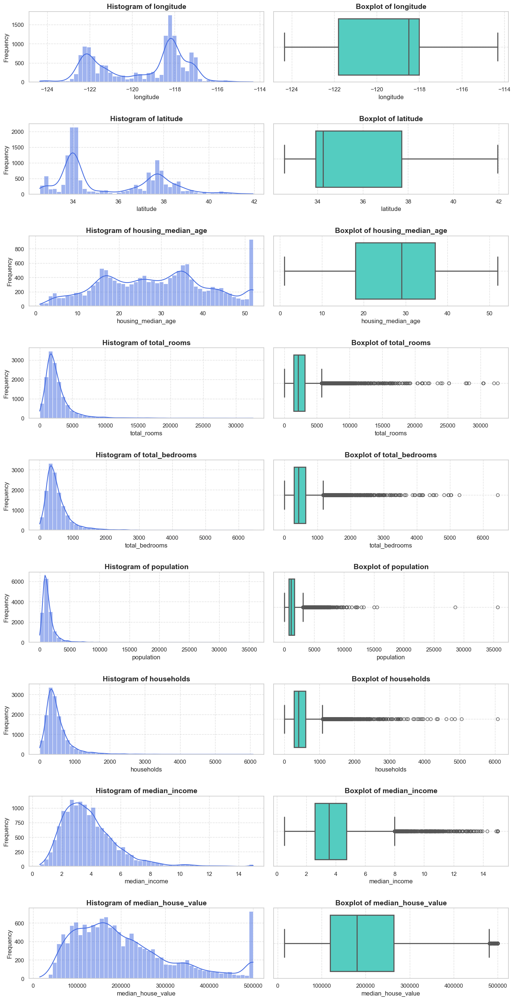

In [647]:
hist_color = '#4169E1'
box_color = '#40E0D0'

plt.figure(figsize=(14, len(numerical) * 3))

for index, col in enumerate(numerical):
    # Histogram
    plt.subplot(len(numerical), 2, index * 2 + 1)
    sns.histplot(data[col], kde=True, color=hist_color, bins=50)
    plt.title(f'Histogram of {col}', size=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

    # Boxplot
    plt.subplot(len(numerical), 2, index * 2 + 2)
    sns.boxplot(x=data[col], color=box_color, linewidth=2)
    plt.title(f'Boxplot of {col}', size=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(h_pad=2.5)
plt.show()

Berdasarkan grafik diatas, dapat dilihat fitur-fitur **selain** `longitude`, `latitude`, dan `housing_median_age` memiliki karakteristik **right skewed** atau data terdistribusi positif **skewed**. Persebaran data dengan karakteristik *right skewed* menandakan bahwa mayoritas data memiliki persebaran pada batas bawah. 

Model *machine learning* seperti Linear Regression mengasumsikan input atau fitur-fitur yang ada terdistribusi secara normal. Adanya kemiringan pada distribusi fitur dapat mengenalkan bias yang mengakibatkan turunnya performa model. Bagi beberapa model lainnya, seperti KNN (*distance-based algorithms*) dan *tree based models*, kemiringan pada distribusi fitur dapat mengganggu kinerja model terutama untuk data pada bagian *tail* dari distribusi.

Secara umum, fitur dengan *skewed distribution* dapat membuat model mengalami kesulitan dalam memahami pola serta dalam *generalization*. Hal ini dapat menyebabkan turunnya akurasi dan menambah nilai error. Model juga dapat mengalami *overfitting* dikarenakan model dimungkinkan untuk terlalu mempelajari distribusi *skewed data*.

Diperlukan analisis serta penanganan tersendiri untuk kasus tersebut yang akan dibahas pada sub-bab selanjutnya.


**Ketidakwajaran data pada fitur `housing_median_age` serta target/label `median_house_value`**

Secara sekilas, apabila dilihat dari distribusi data kolom `housing_median_age` serta `median_house_value`, terdapat nilai dengan frekuensi kemunculan data yang melunjak pada bagian kanan distribusi (bernilai besar). Kondisi ini dapat mengindikasikan adanya nilai berupa *cencored data*. 

Censored data* merujuk ke suatu data dengan nilai pengamatannya **hanya sebagian yang diketahui secara benar**. Dengan kata lain, nilai sesungguhnya terdapat pada suatu *treshold* tetapi tidak diketahui nilai sebenarnya (nilai sebenarnya hanya dapat diketahui lebih besar atau lebih kecil dari *treshold* yang ada). Terdapat beberapa jenis *censoring*:

- *Right-censoring*: Nilai sebenarnya **lebih besar** dibanding suatu *treshold*
- *Left-censoring*: Nilai sebenarnya **lebih kecil** dibanding suatu *treshold*
- *Interval-censoring*: Nilai sebenarnya **berada pada suatu interval**

*source: Klein, J.P., & Moeschberger, M.L. (2003). Survival Analysis: Techniques for Censored and Truncated Data. Springer*

Berikut adalah indikasi adanya *censoring data* pada `housing_median_age` serta target/label `median_house_value`

In [648]:
censored_age = data['housing_median_age'].value_counts().to_frame().head().reset_index()
censored_age['percentage'] = round(censored_age['count'] / len(data) *100,2)

censored_value = data['median_house_value'].value_counts().to_frame().head().reset_index()
censored_value['percentage'] = round(censored_value['count'] / len(data) *100,2)

display(censored_age,censored_value)

,housing_median_age,count,percentage
0,52.0,896,6.20
1,36.0,585,4.05
2,35.0,573,3.97
3,16.0,523,3.62
4,17.0,502,3.47


,median_house_value,count,percentage
0,500001.0,678,4.69
1,137500.0,85,0.59
2,162500.0,79,0.55
3,187500.0,70,0.48
4,225000.0,69,0.48


Berdasarkan tabel serta grafik distribusi diatas, dapat dilihat kolom `housing_median_age` memiliki *spike* pada usia 52 tahun, yaitu sebanyak 896 data atau sekitar 6.2% dari total data yang ada. Kondisi ini dapat memiliki indikasi berupa *right-cencoring*. Hal ini dikarenakan berdasarkan *The San Fransisco Planning Departement*, terdapat data dan studi yang mengindikasikan banyak rumah yang didirikan di San Fransisco jauh sebelum tahun 1938 (usia rumah 52 tahun).

*source: [San Fransisco Planning Department](https://sfplanning.org/)*

Sama halnya dengan kasus diatas, target/label `median_house_value` memiliki *spike* pada nilai 500,001 USD, yaitu sebanyak 678 data atau sekitar 4.7% dari total data yang ada. Kondisi ini dapat memiliki indikasi berupa *right-cencoring*. Selain dengan alasan yang sama seperti pada kasus `housing_median_age`, nilai 500,001 USD memiliki nilai satuan yang unik dibanding dengan nilai-nilai lainnya berupa satuan 1 USD.

**Outliers**

*Outlier* dari masing-masing fitur dapat diidentifikasi seperti berikut.

In [649]:
def calculate_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

In [650]:
outlier_data = []

numerical = [var for var in data.columns if data[var].dtypes != 'object']

for column in numerical:
    outlier_result, lower_bound, upper_bound = calculate_outliers(data, column)
    total_outlier = len(outlier_result)
    outlier_percentage = round(total_outlier / len(data[column]) * 100, 2)
    outlier_data.append([column, total_outlier, outlier_percentage, lower_bound, upper_bound])

outlier_df = pd.DataFrame(outlier_data, columns=["Column", "Total Outliers", "Percentage (%)", "Lower Bound", "Upper Bound"])
outlier_df

,Column,Total Outliers,Percentage (%),Lower Bound,Upper Bound
0,longitude,0,0.00,-127.50000,-112.30000
1,latitude,0,0.00,28.26000,43.38000
2,housing_median_age,0,0.00,-10.50000,65.50000
3,total_rooms,900,6.23,-1094.50000,5693.50000
4,total_bedrooms,879,6.08,-233.00000,1175.00000
5,population,827,5.72,-626.00000,3134.00000
6,households,842,5.83,-208.50000,1091.50000
7,median_income,482,3.34,-0.67765,7.98435
8,median_house_value,757,5.24,-96850.00000,480350.00000


Dapat dilihat pada tabel diatas, *outlier* pada fitur-fitur yang ada memiliki rentang dari 3.34% - 6.23%. Untuk fitur-fitur yang menggambarkan kondisi fisik rumah seperti `total_rooms` dan `total_bedrooms`, *outlier* yang ditemukan pada batas atas dapat disebabkan oleh rumah-rumah mewah atau *mansion* pada beberapa kompleks sehingga wajar apabila total kamar dan kamar tidur pada kompleks tersebut sangat tinggi. untuk fitur `population` dan `household`, *outlier* pada batas atas dapat menggambarkan kepadatan pada area urban atau sangat padat penduduk. 

Secara *domain knowledge*, *outlier* yang terkandung pada fitur-fitur tersebut **memiliki informasi yang penting** terhadap target. Secara proporsi, dapat dilihat mayoritas fitur memiliki persentase data *outlier* yang cukup signifikan (lebih dari 5% dari total data) sehingga menghilangkan data tersebut berpotensi menganggu model untuk menciptakan generalisasi terhadap data yang ada.

Tingkat kepentingan informasi yang tersimpan dalam *outlier* dapat dilihat dari korelasi fitur terhadap target. Nilai korelasi sendiri sebenarnya masih belum cukup dalam menangkap kompleksitas interaksi antar fitur dalam pemodelan. Tahapan ini dilakukan sebagai identifikasi awal untuk memahami efek dari *outlier* pada fitur terhadap target. 

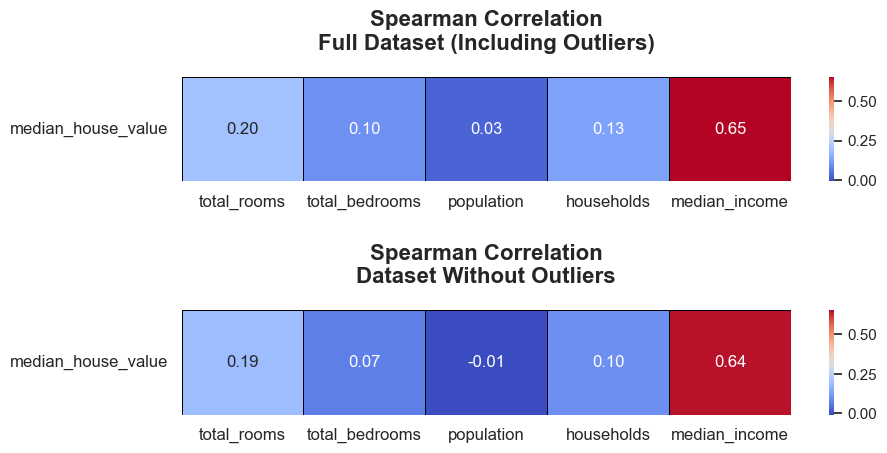

In [651]:
# Korelasi fitur terhadap target (dataset lengkap, termasuk outlier)
# Hanya mengambil fitur yang memiliki outlier
features_with_outlier = data[['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']]
features_with_outlier = features_with_outlier[features_with_outlier['median_house_value'] != 500001]
correlation = features_with_outlier.corr(method='spearman').iloc[-1, :-1].to_frame().T

# Korelasi fitur terhadap target untuk fitur-fitur tanpa outlier
kolom_cek = ['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']
corr_val = []

for i in kolom_cek:
    outliers, lower_bound, upper_bound = calculate_outliers(data[data['median_house_value'] != 500001],i)
    corr_val.append(data[(data[i] > lower_bound) & (data[i] < upper_bound)].corr(method='spearman',numeric_only=True).loc[i][-1])

correlation_no_outlier = pd.DataFrame(corr_val, index=kolom_cek, columns=['median_house_value']).T

# Set up the matplotlib figure
plt.figure(figsize=(10,5))

# Set a common color range for all heatmaps
vmin = min(correlation.min().min(), correlation_no_outlier.min().min())
vmax = max(correlation.max().max(), correlation_no_outlier.max().max())

# Plotting the heatmaps
plt.subplot(211)
sns.heatmap(correlation, annot=True, cmap="coolwarm", cbar=True, linewidths=0.5, linecolor='black', annot_kws={"size": 12}, fmt=".2f", vmin=vmin, vmax=vmax)
plt.title("Spearman Correlation\nFull Dataset (Including Outliers)", fontsize=16, fontweight='bold', pad=20)
plt.yticks(rotation=0, fontsize=12)
plt.xticks(fontsize=12)

plt.subplot(212)
sns.heatmap(correlation_no_outlier, annot=True, cmap="coolwarm", cbar=True, linewidths=0.5, linecolor='black', annot_kws={"size": 12}, fmt=".2f", vmin=vmin, vmax=vmax)
plt.title("Spearman Correlation\nDataset Without Outliers", fontsize=16, fontweight='bold', pad=20)
plt.yticks(rotation=0, fontsize=12)
plt.xticks(fontsize=12)

# Adjust layout for better spacing
plt.tight_layout(pad=2.0)

# Show the plot
plt.show()

Berdasarkan *heatmap* korelasi diatas, dapat dilihat bahwa nilai korelasi fitur terhadap target cenderung turun walaupun tidak sigkifikan saat *outliers* yang ada dihilangkan dari data. Hal ini dapat mengindikasikan *outlier* yang ada dapat menggambarkan informasi yang *valuable* pada kasus ekstrim, walaupun tidak signifikan.

Sebagai salah satu contoh, untuk kasus data *outliers* pada fitur `median_income`, nilai tersebut dapat menggambarkan kasus hubungan *high-income* serta *high-valued properties*. Apabila nilai tersebut dihilangkan, informasi terkait hubungan tersebut juga dapat hilang.

**Correlation**

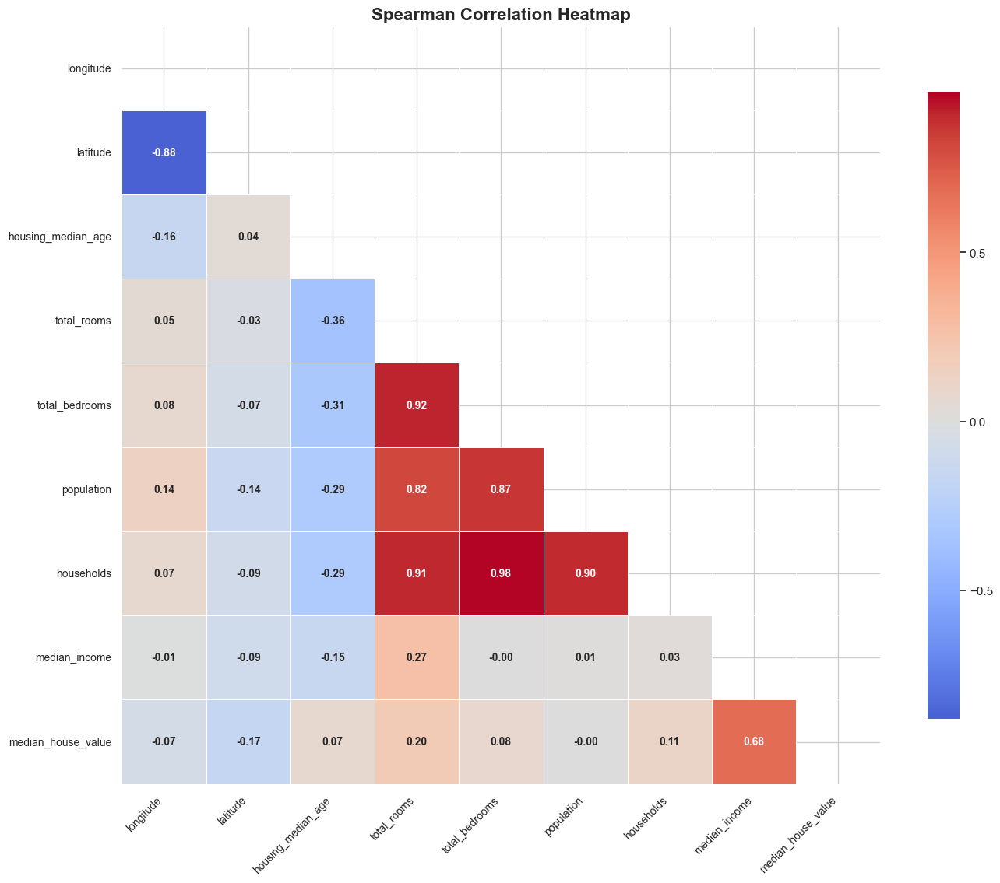

In [652]:
plt.figure(figsize=(14, 12))

corr_matrix = data.corr(method='spearman', numeric_only=True)

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, 
            mask=mask, 
            annot=True, 
            fmt=".2f", 
            cmap='coolwarm', 
            center=0, 
            square=True, 
            linewidths=.5, 
            cbar_kws={"shrink": .75, "ticks": [-1, -0.5, 0, 0.5, 1]},
            annot_kws={"size": 10, "weight": "bold"})

plt.title('Spearman Correlation Heatmap', size=16, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

plt.show()

Grafik diatas merupakan *heatmap* dari korelasi Spearman tiap-tiap feature dan target. Didapat beberapa ***insight***:
1. Fitur `median_income` memiliki **nilai korelasi tertinggi terhadap target**: didapat korelasi positif sebesar 0.68. Hal ini menandakan kompleks dengan `median_income` yang tinggi cenderung memilki nilai `median_house_value` yang tinggi. Dengan kata lain, faktor ekonomi atau pendapatan area/kompleks memiliki pengaruh terhadap nilai rumah.
1. Fitur `total_rooms`, `total_bedrooms`, dan `population` memiliki **inter-feature correlation** yang tinggi (positif, diatas 0.90). Dari fitur-fitur yang sama, dapat dilihat bahwa fitur-fitur tersebut **memiliki korelasi yang rendah** terhadap target.

Berdasarkan insight tersebut, dapat disimpulkan untuk fitur-fitur yang memiliki inter-feature correlation yang tinggi, dapat memungkinkan adanya **multicollinearity** pada model yang akan digunakan sehingga memungkinkan untuk dilakukannya **Feature Engineering**. Penjelasan serta tindak lanjut dari insight tersebut akan dibahas pada sub-bab selanjutnya.

**Feature vs Target**

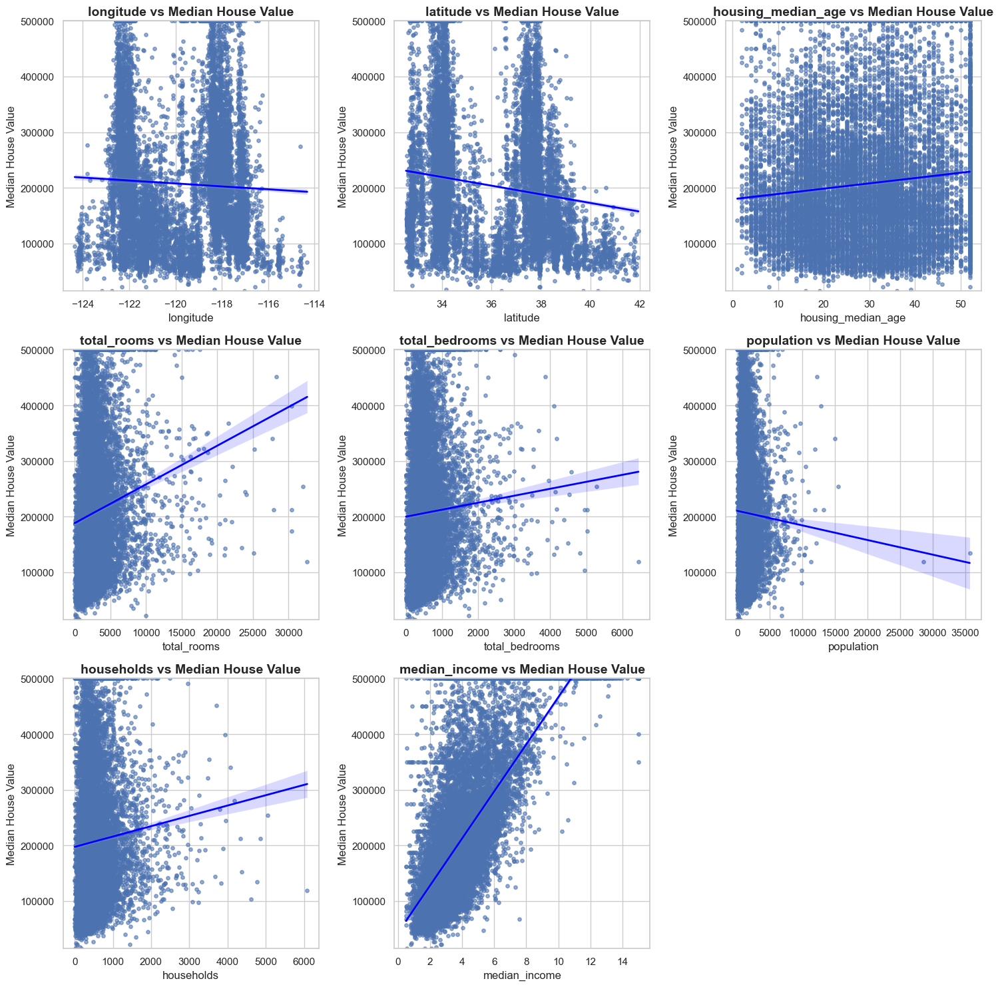

In [655]:
# Numerical feature vs target
fig, axes = plt.subplots((len(numerical[:-1]) + 3 - 1) // 3, 3, figsize=(15, (len(numerical[:-1]) + 3 - 1) // 3 * 5))

axes = axes.flatten()

for i, col in enumerate(numerical[:-1]):
    sns.regplot(x=data[col], y=data['median_house_value'], 
                ax=axes[i], 
                scatter_kws={'s': 15, 'alpha': 0.6},
                line_kws={'color': 'blue', 'lw': 2})  
    axes[i].set_title(f'{col} vs Median House Value', fontsize=14, fontweight='bold')
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Median House Value', fontsize=12)
    axes[i].grid(True) 

    axes[i].set_ylim(data['median_house_value'].min(), data['median_house_value'].max())

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

#### **`Categorical Features`**

**Data Distribution**

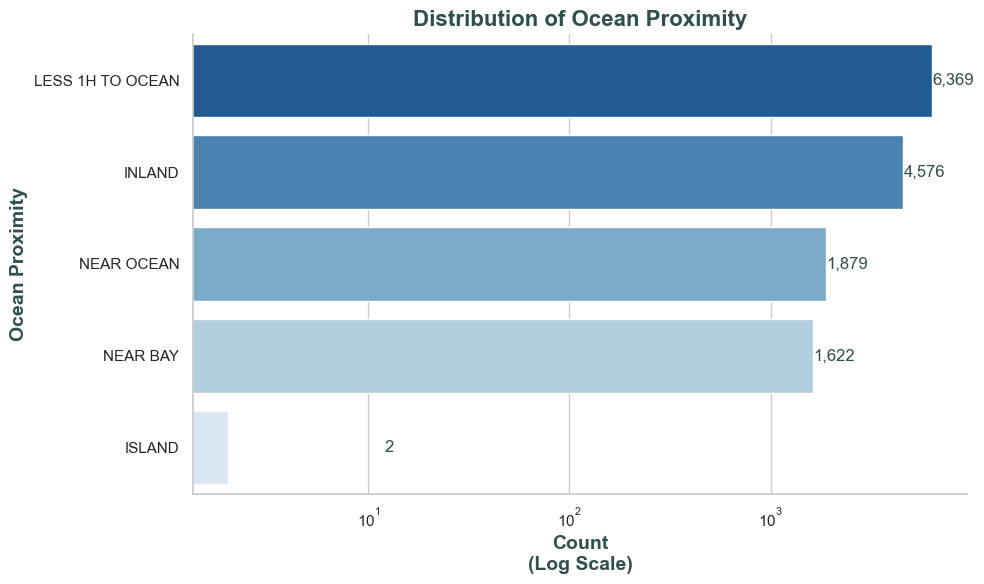

In [656]:
fig, ax = plt.subplots(figsize=(10, 6))

sns.countplot(data=data, 
              y='ocean_proximity', 
              order=data['ocean_proximity'].value_counts().index, 
              ax=ax, 
              palette='Blues_r')

ax.set_title('Distribution of Ocean Proximity', fontsize=16, fontweight='bold', color='#2F4F4F')
ax.set_xlabel('Count\n(Log Scale)', fontsize=14, fontweight='bold', color='#2F4F4F')
ax.set_ylabel('Ocean Proximity', fontsize=14, fontweight='bold', color='#2F4F4F')
ax.set_xscale('log')

for p in ax.patches:
    count = int(p.get_width())
    ax.text(p.get_width() + 10, 
            p.get_y() + p.get_height() / 2, 
            f'{count:,}', 
            va='center', 
            ha='left', 
            fontsize=12, 
            color='#2F4F4F')

plt.tight_layout()
despine(ax)
plt.show()

Persentase untuk tiap-tiap data unik dapat dihitung seperti berikut.

In [657]:
# Menghitung persentase value dari kolom kategorikal ocean_proximity
data['ocean_proximity'].value_counts(normalize=True).to_frame().reset_index()

,ocean_proximity,proportion
0,LESS 1H TO OCEAN,0.440822
1,INLAND,0.316722
2,NEAR OCEAN,0.130053
3,NEAR BAY,0.112265
4,ISLAND,0.000138


Berdasarkan grafik dan perhitungan proporsi diatas, dapat dilihat bahwa kompleks dengan lokasi `<1H OCEAN` dan `INLAND` mendominasi dataset dengan jumlah proporsi sebesar 75.75%. Berdasarkan grafik diatas, dapat dilihat bahwa data dengan `Ocean Proximity` ISLAND memiliki nilai yang sangat kecil dibandingkan dengan data unik lainnya (persentasenya hanya sebesar 0.01%). Minimnya proprosi data ISLAND tersebut perlu ditinjau lebih dalam dikarenakan dapat berpotensi mengganggu kinerja model machine learning. Pembahasan dan penanganan lebih lanjut akan dibahas pada sub-bab selanjutnya.

**Feature vs Target**

Berikut adalah boxplot `median_house_value` dari masing-masing kategori.

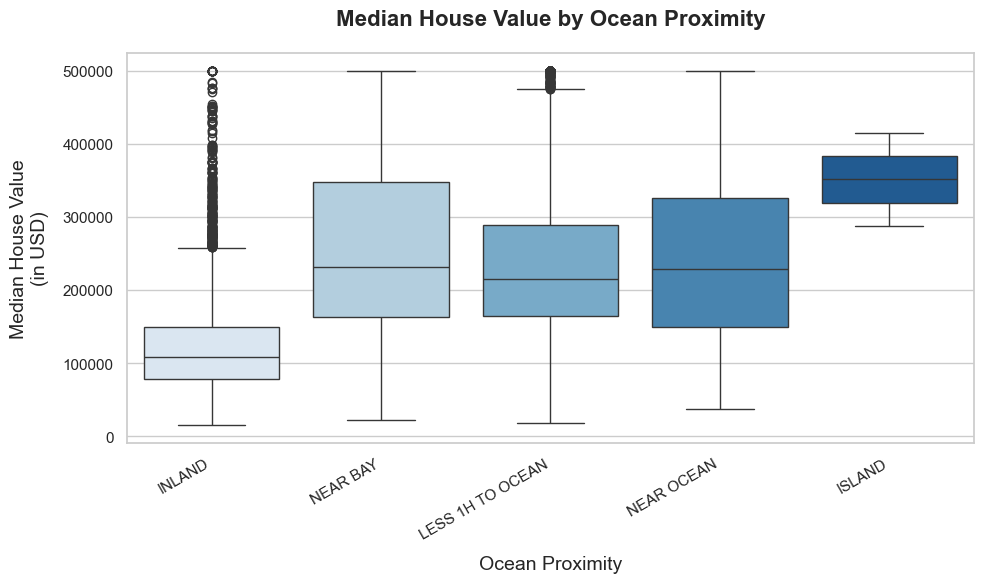

In [658]:
plt.figure(figsize=(10,6))

sns.boxplot(
    data=data,
    x='ocean_proximity',
    y='median_house_value',
    palette='Blues'
)

plt.title('Median House Value by Ocean Proximity', fontsize=16, weight='bold', pad=20)
plt.xlabel('Ocean Proximity', fontsize=14, labelpad=10)
plt.ylabel('Median House Value\n(in USD)', fontsize=14, labelpad=10)
plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.show()

Berdasarkan grafik diatas, dapat dilihat bahwa ISLAND memiliki nilai tengah dari median_house_value kompleks perumahan yang paling tinggi dibanding dengan `ocean_proximity` lainnya. Hal ini masih perlu diperhatikan lebih jauh menimbang **proporsi ISLAND pada dataset yang sangat kecil** sehingga tidak dapat merepresentasikan nilai sebenarnya secara benar. 

Apabila data ISLAND diabaikan, nilai tengah tertinggi dari median_house_value kompleks perumahan terdapat pada NEAR BAY, kemudian disusul dengan NEAR OCEAN, <1H OCEAN, serta INLAND.

#### **`Location`**
Untuk lebih detailnya, kolom keterangan mengenai kedekatan dengan pantai atau `ocean_proximity` dapat dilihat dalam peta dengan menggunakan fitur bantuan `latitude` dan `longitude`. Berikut adalah pembacaan `ocean_proximity` pada peta.

In [659]:
# Add custom base maps to folium
basemaps = {
    'Google Maps': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Maps',
        overlay = True,
        control = True
    ),
    'Google Satellite': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Satellite',
        overlay = True,
        control = True
    ),
    'Google Terrain': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=p&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Terrain',
        overlay = True,
        control = True
    ),
    'Google Satellite Hybrid': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Satellite',
        overlay = True,
        control = True
    ),
    'Esri Satellite': folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = True,
        control = True
    )
}

In [660]:
basemaps['Google Satellite Hybrid']

In [661]:
# Define the central latitude and longitude for California
latitude = 37.3783
longitude = -119.4179

# Create a map centered around California
california_map = folium.Map(
    location=[latitude, longitude],
    zoom_start=6,  # Adjust the zoom level to focus on California
)

# Load the GeoJSON file for U.S. states
geo_json_path = r'us-states.json'
gdf = gpd.read_file(geo_json_path)

# Filter for California only
california_gdf = gdf[gdf['name'] == 'California']

# Convert the filtered GeoDataFrame back to GeoJSON
california_geojson = california_gdf.to_json()

# Add the filtered GeoJSON layer to the map
folium.GeoJson(
    california_geojson,
    name="California"
).add_to(california_map)

# Define colors for different ocean_proximity categories
colors = {
    'INLAND': 'yellow',
    'NEAR BAY': 'green',
    '<1H OCEAN': 'blue',
    'NEAR OCEAN': 'red',
    'ISLAND': 'purple'
}

# Iterate over ocean_proximity categories and add them to the map
for category, color in colors.items():
    feature_group = folium.map.FeatureGroup(name=category)
    
    for lat, long in zip(data[data['ocean_proximity'] == category]['latitude'], 
                         data[data['ocean_proximity'] == category]['longitude']):
        feature_group.add_child(
            folium.vector_layers.CircleMarker(
                [lat, long],
                radius=1,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.6
            )
        )
    
    feature_group.add_to(california_map)

# Display the map
california_map

**Keterangan peta**:
- Merah: Near Ocean
- Biru: <1H Ocean
- Hijau: Near Bay
- Ungu: Island
- Kuning: Inland

Berdasarkan peta diatas, dapat dilihat lebih jelas persebaran kompleks perumahan sekaligus dengan detail geografis garis pantai pada California. Berdasarkan peta diatas juga dapat dilihat informasi mengenai *bay* atau teluk yang dimaksud serta pulau atau island yang dimaksud. Persebaran kompleks perumahan juga bisa digambarkan dengan grafik seperti berikut.

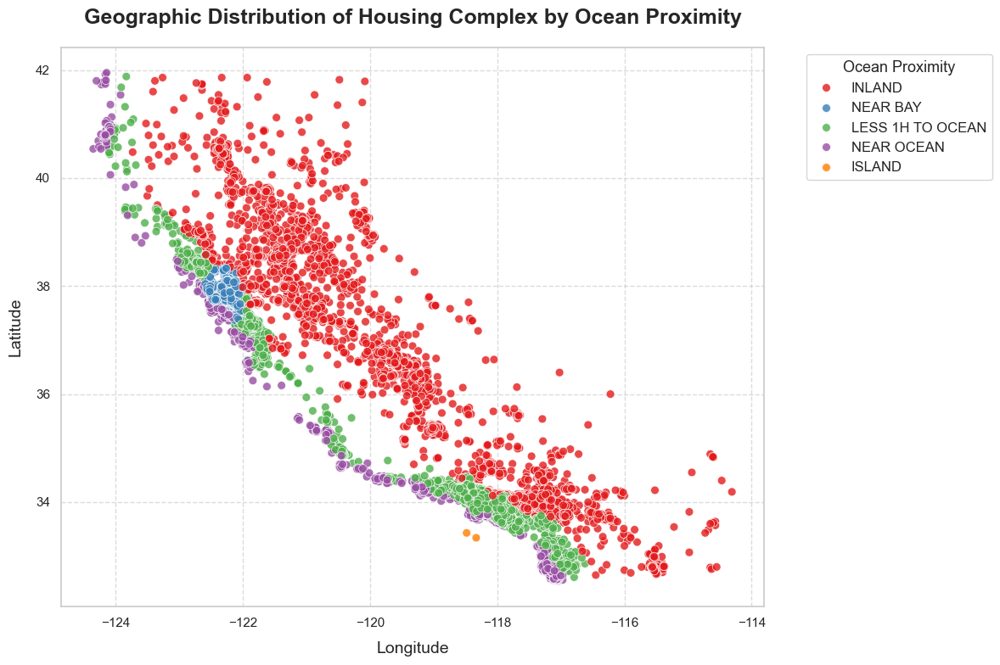

In [662]:
# Lokasi berdasarkan Ocean Proximity
plt.figure(figsize=(12, 8))
scatter_plot = sns.scatterplot(
    data=data,
    x='longitude',
    y='latitude',
    hue='ocean_proximity',
    palette='Set1',  
    edgecolor='w',      
    s=50,              
    alpha=0.8         
)

scatter_plot.set_title('Geographic Distribution of Housing Complex by Ocean Proximity', fontsize=18, weight='bold', pad=20)
scatter_plot.set_xlabel('Longitude', fontsize=14, labelpad=10)
scatter_plot.set_ylabel('Latitude', fontsize=14, labelpad=10)

plt.legend(title='Ocean Proximity', title_fontsize='13', fontsize='12', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

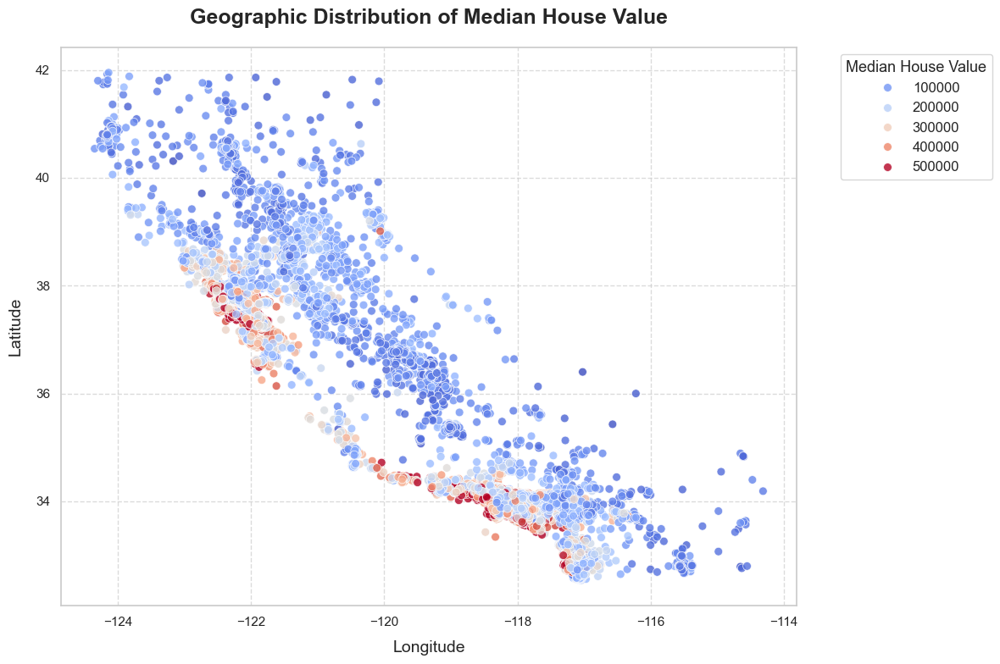

In [663]:
# Lokasi berdasarkan Median House Value
plt.figure(figsize=(12, 8))

scatter_plot = sns.scatterplot(
    data=data,
    x='longitude',
    y='latitude',
    hue='median_house_value', 
    palette='coolwarm',  
    edgecolor='w',  
    s=50,  
    alpha=0.8  
)

scatter_plot.set_title('Geographic Distribution of Median House Value', fontsize=18, weight='bold', pad=20)
scatter_plot.set_xlabel('Longitude', fontsize=14, labelpad=10)
scatter_plot.set_ylabel('Latitude', fontsize=14, labelpad=10)

plt.legend(title='Median House Value', title_fontsize='13', fontsize='12', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Berdasarkan grafik diatas, dapat dilihat perumahan dengan nilai median rumah tertinggi **terkonsentrasi pada daerah dekat pantai**. Daerah `INLAND` atau dengan jarak yang jauh dari pantai memiliki perumahan dengan nilai median rumah yang lebih rendah. Hal ini dikarenakan daerah-daerah dekat pantai (San Fransisco, Los Angeles, dan lain-lain) dikenal dengan harga perumahan yang tinggi.

#### **EDA Conclusions**
Berdasarkan EDA yang telah dilakukan, didapat beberapa ***insight*** untuk proses selanjutnya:
1. Fitur `housing_median_age` dan `median_house_value` memiliki nilai tak wajar dengan indikasi berupa data *censored*.
1. Fitur-fitur selain `latitude`, `longitude`, dan `housing_median_age` memiliki data outlier. Harus dilakukan pengecekkan apakah data outlier tersebut dapat mengganggu kinerja model.
1. Fitur `total_rooms`, `total_bedrooms`, `population`, dan `households` memiliki **inter-feature correlation** yang tinggi dan memiliki **korelasi terhadap target yang rendah**.
1. Fitur `ocean_proximity` memiliki data ISLAND dengan proporsi yang sangat rendah (0.01%). Rendahnya representasi tersebut pada dataset harus ditindaklanjuti. 

---
### **4.** ***DATA CLEANING, FEATURE SELECTION AND FEATURE ENGINEERING***

#### Pengecekkan data `Duplicates`

In [664]:
print(f"Jumlah duplikasi data: {data[data.duplicated()].shape}")
print(f'Persentase sebesar {len(data[data.duplicated()])/len(data)*100:.2f}%')

Jumlah duplikasi data: (0, 10)
Persentase sebesar 0.00%


Berdasarkan pengecekkan diatas, tidak terdapat data duplikat pada dataset.

#### Pengecekkan `Missing Values`

In [665]:
missVal = pd.DataFrame({'null': [data[col].isna().sum() for col in data.columns]}, index=data.columns.values)
missVal['null(%)'] = round((missVal['null']/len(data))*100, 4)
missVal

,null,null(%)
longitude,0,0.0000
latitude,0,0.0000
housing_median_age,0,0.0000
total_rooms,0,0.0000
total_bedrooms,137,0.9482
population,0,0.0000
households,0,0.0000
median_income,0,0.0000
ocean_proximity,0,0.0000
median_house_value,0,0.0000


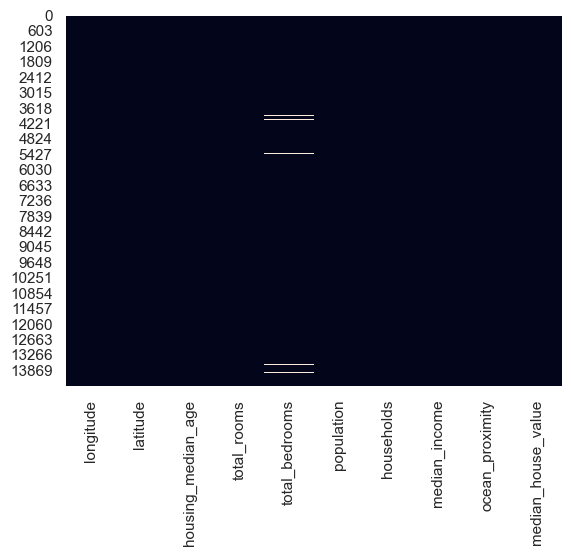

In [666]:
# Missing value heatmap
sns.heatmap(data.isnull(), cbar=False);

Berdasarkan tabel diatas, dapat dilihat fitur `total_bedrooms` memiliki missing value sebanyak 137 atau jika dipersentasekan sebesar 0.95%. Berdasarkan grafik diatas, dapat disimpulkan juga bahwa missing value tersebar acak pada dataset tanpa adanya pola missing value dari kolom lain. Hal ini dapat mengindikasi bahwa jenis missing value dari fitur tersebut merupakan **Missing Completely at Random** (MCAR). 

Dikarenakan proporsi data yang hilang kurang dari 5%, menghapus data yang hilang tersebut kemungkinan besar tidak akan mengganggu hasil analisis maupun menyebabkan kehilangan informasi yang signifikan.

*Reference: Little, R.J.A., & Rubin, D.B. (2002). Statistical Analysis with Missing Data. Wiley*

In [667]:
# Drop missing value
data.dropna(inplace=True)

#### Ketidakwajaran data fitur `housing_median_age` dan target `median_house_value`
Seperti yang telah dijabarkan pada EDA sebelumnya, terdapat indikasi bahwa fitur `housing_median_house` serta target `median_house_value` memiliki *censored data*. Dikarenakan nilai sebenarnya dari data-data tersebut tidak dapat dicari/ditentukan, data tersebut akan dihilangkan/didrop.

In [668]:
# Drop median_house_value
data = data[data['median_house_value'] != 500001.0]

# Drop housing_median_age
data = data[data['housing_median_age'] != 52.0]

Jumlah dan persentase data yang di drop dapat ditentukan seperti berikut.

In [669]:
print(f'Jumlah data censored: {14448 - len(data)}')
print(f'Persentase data censored: {(14448 - len(data))/14448 *100:.2f}%')

Jumlah data censored: 1575
Persentase data censored: 10.90%


Berdasarkan perhitungan diatas, dapat dilihat sebanyak 1575 data atau sekitar 10.9% total data harus di drop/dihilangkan. 

#### Proporsi data ISLAND pada fitur `ocean_proximity`
Seperti yang telah dijabarkan pada EDA sebelumnya, jumlah data dengan `ocean_proximity` berupa ISLAND memiliki proporsi yang sangat sedikit. Dikarenakan jumlah data yang sangat tidak signifikan tersebut berpotensi dapat mengganggu performa model dan juga dirasa tidak cukup merepresentasikan data yang ada, data tersebut akan dihilangkan/didrop.

In [670]:
# Yang island drop
data = data[data['ocean_proximity'] != 'ISLAND']

#### *Generating New Features*
Seperti yang telah dijabarkan pada EDA sebelumnya, fitur `total_rooms`, `total_bedrooms`, `population`, serta `households` memiliki **inter-feature correlation** yang tinggi dan memiliki **korelasi terhadap target yang rendah**. Oleh karena itu, akan dilakukan pembentukan fitur baru dengan harapan dapat meningkatkan akurasi model. Beberapa fitur baru yang dapat dibentuk adalah:

<div align="center">

| Fitur Baru | Deskripsi | Keterangan |
| --- | --- | --- |
| `rooms_per_person` | Rasio jumlah kamar per orang | Inter-feature correlation tinggi |
| `room_bedroom_ratio` | Rasio jumlah kamar terhadap kamar tidur. | Inter-feature correlation tinggi |
| `bedrooms_per_household` | Jumlah kamar tidur rata-rata per rumah tangga. | Inter-feature correlation tinggi |
| `population_per_household` | Jumlah orang rata-rata per rumah tangga. | Inter-feature correlation tinggi |
| `rooms_per_household` | Jumlah kamar rata-rata per rumah tangga. | Inter-feature correlation tinggi |
| `longitude_per_latitude` | Rasio antara longitude dan latitude. | Low Correlation Interaction |

</div>

In [875]:
# Membuat copy dari dataset
data_FE = data.copy()

# Membentuk fitur-fitur baru
data_FE['rooms_per_person'] = data_FE['total_rooms'] / data_FE['population']
data_FE['room_bedroom_ratio'] = data_FE['total_rooms'] / data_FE['total_bedrooms']
data_FE['bedrooms_per_household'] = data_FE['total_bedrooms'] / data_FE['households']
data_FE['population_per_household'] = data_FE['population'] / data_FE['households']
data_FE['rooms_per_household'] = data_FE['total_rooms'] / data_FE['households']
data_FE['longitude_per_latitude'] = data_FE['longitude'] / data_FE['latitude']

data_FE.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,rooms_per_person,room_bedroom_ratio,bedrooms_per_household,population_per_household,rooms_per_household,longitude_per_latitude
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0,1.216507,3.100610,1.184116,3.018051,3.671480,-3.235637
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,LESS 1H TO OCEAN,285800.0,1.700072,5.954545,1.087912,3.810440,6.478022,-3.485090
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,LESS 1H TO OCEAN,175000.0,0.825303,2.105351,1.196000,3.051000,2.518000,-3.472695
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0,1.273927,3.979381,1.161677,3.628743,4.622754,-3.261911
5,-117.79,33.80,11.0,10535.0,1620.0,4409.0,1622.0,6.6700,LESS 1H TO OCEAN,283200.0,2.389431,6.503086,0.998767,2.718249,6.495068,-3.484911


#### *Feature Selection*
Setelah dibentuk beberapa fitur baru dengan harapan dapat memiliki tingkat korelasi yang lebih tinggi terhadap target, akan dilakukan *iterative feature selection* dengan metode *forward* dan juga *backward* sehingga model yang dihasilkan tidak terlalu kompleks untuk menghindari adanya *overfitting*. Untuk *iterative feature selection*, digunakan model XGBoost. Hal ini dikarenakan model *tree-based* seperti XGBoost tidak terlalu dipengaruhi oleh *scaler* dari masing-masing fitur.

Setelah dilakukan *iterative feature selection*, akan dilanjutkan pemilihan fitur dengan metode *univariate statistic feature selection* berupa korelasi. Hal ini dilakukan untuk lebih lanjut menyeleksi fitur agar mengurangi kompleksitas model, menghindari adanya *overfitting* dalam pemodelan.

In [673]:
# Data splitting untuk feature selection
X_FE = data_FE.drop(columns=['median_house_value'])
y_FE = data_FE['median_house_value']

from sklearn.model_selection import train_test_split, KFold

XFE_train, XFE_test, yFE_train, yFE_test = train_test_split(X_FE, y_FE, test_size=0.3, random_state=1)

*Backward Feature Elimination*

In [674]:
# Encoding fitur kategorikal
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse_output=False)
X_encoded = encoder.fit_transform(XFE_train[['ocean_proximity']])

# Convert back to a DataFrame
X_encoded_df = pd.DataFrame(X_encoded, columns=encoder.get_feature_names_out())

# Concatenate with the rest of the dataset (drop the original categorical column first)
XFE_train_encoded = pd.concat([XFE_train.drop(columns=['ocean_proximity']).reset_index(drop=True), X_encoded_df.reset_index(drop=True)], axis=1)

In [675]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from xgboost.sklearn import XGBRegressor
from sklearn.compose import TransformedTargetRegressor

crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define selector for regression
backward = SFS(
    estimator=TransformedTargetRegressor(XGBRegressor(random_state=1), func=np.log, inverse_func=np.exp),
    k_features='best',
    forward=False,
    floating=False,
    verbose=1,
    scoring='neg_mean_absolute_error',
    cv=crossval
)

# Fit the selector to the data
backward = backward.fit(XFE_train_encoded.values, yFE_train)

Features: 1/11

In [676]:
# Hasil backward elimination
selector_backward = XFE_train_encoded.columns[list(backward.k_feature_idx_)]
selector_backward

Index(['longitude', 'latitude', 'housing_median_age', 'total_bedrooms',
       'median_income', 'room_bedroom_ratio', 'population_per_household',
       'rooms_per_household', 'longitude_per_latitude',
       'ocean_proximity_INLAND', 'ocean_proximity_NEAR BAY'],
      dtype='object')

In [677]:
list(backward.k_feature_idx_)

[0, 1, 2, 4, 7, 9, 11, 12, 13, 14, 16]

In [678]:
pd.DataFrame(backward.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
18,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[-28692.540200558407, -28913.5580930043, -2983...",-28649.188823,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",936.165823,728.368815,364.184408
17,"(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[-28316.570570459906, -29149.61183103843, -292...",-28626.586554,"(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",599.492581,466.425595,233.212798
16,"(0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 1...","[-29280.83644041343, -28831.857903111126, -288...",-28550.44244,"(0, 1, 2, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 1...",1005.796113,782.543547,391.271773
15,"(0, 1, 2, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 1...","[-29031.872569974334, -29316.295006416483, -29...",-28539.745657,"(0, 1, 2, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 1...",977.31436,760.383775,380.191887
14,"(0, 1, 2, 4, 5, 7, 9, 11, 12, 13, 14, 15, 16, 17)","[-28770.44537102872, -29357.630248075056, -288...",-28416.848679,"(0, 1, 2, 4, 5, 7, 9, 11, 12, 13, 14, 15, 16, 17)",943.380291,733.981916,366.990958
13,"(0, 1, 2, 4, 7, 9, 11, 12, 13, 14, 15, 16, 17)","[-28708.855117577692, -28275.24694133255, -287...",-28211.036356,"(0, 1, 2, 4, 7, 9, 11, 12, 13, 14, 15, 16, 17)",644.452202,501.405707,250.702854
12,"(0, 1, 2, 4, 7, 9, 11, 12, 13, 14, 16, 17)","[-28615.478888474612, -28507.836030712402, -28...",-28257.456023,"(0, 1, 2, 4, 7, 9, 11, 12, 13, 14, 16, 17)",608.79669,473.664508,236.832254
11,"(0, 1, 2, 4, 7, 9, 11, 12, 13, 14, 16)","[-28312.09381719964, -28803.54174181465, -2891...",-28142.653638,"(0, 1, 2, 4, 7, 9, 11, 12, 13, 14, 16)",878.064928,683.164345,341.582172
10,"(0, 1, 2, 7, 9, 11, 12, 13, 14, 16)","[-27874.021211240983, -28826.931738172865, -28...",-28255.906658,"(0, 1, 2, 7, 9, 11, 12, 13, 14, 16)",425.223821,330.838579,165.41929
9,"(0, 1, 2, 7, 9, 11, 12, 13, 14)","[-28460.956912024834, -29019.75954451651, -283...",-28168.46855,"(0, 1, 2, 7, 9, 11, 12, 13, 14)",839.714207,653.326181,326.66309


*Forward Selection*

In [679]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from xgboost.sklearn import XGBRegressor
from sklearn.compose import TransformedTargetRegressor

crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define selector for regression
forward = SFS(
    estimator=TransformedTargetRegressor(XGBRegressor(random_state=1), func=np.log, inverse_func=np.exp),
    k_features='best',
    forward=True,
    floating=False,
    verbose=1,
    scoring='neg_mean_absolute_error',
    cv=crossval
)

# Fit the selector to the data
forward = forward.fit(XFE_train_encoded.values, yFE_train)

Features: 18/18

In [680]:
# Hasil forward selection
selector_forward = XFE_train_encoded.columns[list(forward.k_feature_idx_)]
selector_forward

Index(['longitude', 'latitude', 'housing_median_age', 'median_income',
       'rooms_per_person', 'population_per_household',
       'longitude_per_latitude', 'ocean_proximity_INLAND',
       'ocean_proximity_LESS 1H TO OCEAN', 'ocean_proximity_NEAR BAY'],
      dtype='object')

In [681]:
pd.DataFrame(forward.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(7,)","[-54417.78394665649, -54641.4429800222, -53124...",-53688.41925,"(7,)",1145.384792,891.148281,445.57414
2,"(0, 7)","[-45413.585196136235, -44879.25947731687, -451...",-44800.81174,"(0, 7)",1301.624815,1012.708327,506.354164
3,"(0, 1, 7)","[-30298.646037822557, -30836.22476328385, -300...",-30163.827438,"(0, 1, 7)",497.405473,386.998357,193.499178
4,"(0, 1, 7, 8)","[-29335.50318222808, -29862.024475842813, -293...",-29318.033256,"(0, 1, 7, 8)",512.693619,398.893054,199.446527
5,"(0, 1, 2, 7, 8)","[-28754.514688540512, -29161.327927736544, -29...",-28627.992243,"(0, 1, 2, 7, 8)",987.162401,768.045885,384.022943
6,"(0, 1, 2, 7, 8, 13)","[-28420.088168094477, -28747.745579997918, -28...",-28191.791897,"(0, 1, 2, 7, 8, 13)",556.578098,433.036669,216.518335
7,"(0, 1, 2, 7, 8, 13, 14)","[-27508.671779619868, -28797.045812812154, -28...",-28113.133971,"(0, 1, 2, 7, 8, 13, 14)",736.729349,573.200463,286.600232
8,"(0, 1, 2, 7, 8, 13, 14, 15)","[-27822.062994242508, -28832.420812812154, -27...",-28050.177486,"(0, 1, 2, 7, 8, 13, 14, 15)",509.339771,396.283646,198.141823
9,"(0, 1, 2, 7, 8, 11, 13, 14, 15)","[-28342.382994589345, -28610.49847391787, -286...",-28184.741085,"(0, 1, 2, 7, 8, 11, 13, 14, 15)",548.944099,427.097158,213.548579
10,"(0, 1, 2, 7, 8, 11, 13, 14, 15, 16)","[-28216.982153076442, -28307.753203905384, -28...",-27973.872726,"(0, 1, 2, 7, 8, 11, 13, 14, 15, 16)",488.551717,380.109834,190.054917


Berdasarkan hasil *iterative feature selection* diatas, didapat insight:
- Backward elimination berhasil memilih 11 fitur dari total 18 fitur yang ada (setelah *encoding*) dengan rata-rata skor MAE sebesar 28142.653638 USD
- Forward selection berhasil memilih 10 fitur dari total 18 fitur yang ada (setelah *encoding*) dengan rata-rata skor MAE sebesar 27973.872726 USD

Berdasarkan hasil tersebut, proses *feature engineering* akan dilanjutkan dengan hasil dari *forward selection* dikarenakan fitur yang dihasilkan lebih sedikit dengan skor MAE paling rendah.

In [876]:
data_FE = data_FE[['longitude', 'latitude', 'housing_median_age', 'median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household', 'longitude_per_latitude', 'ocean_proximity']]

*Univariate Statistic Feature Selection*

Pada tahapan ini, akan dilakukan *feature selection* dengan menghapus fitur yang memiliki inter-feature correlation yang tinggi serta korelasi terhadap target yang rendah.

In [877]:
data_FE.corr(method='spearman', numeric_only=True)

,longitude,latitude,housing_median_age,median_income,rooms_per_person,room_bedroom_ratio,population_per_household,longitude_per_latitude
longitude,1.000000,-0.881640,-0.096660,0.005087,-0.129607,-0.048512,0.163667,-0.792938
latitude,-0.881640,1.000000,-0.011065,-0.088839,0.183255,0.103694,-0.148694,0.970495
housing_median_age,-0.096660,-0.011065,1.000000,-0.183580,-0.216348,-0.176291,0.057440,-0.057587
median_income,0.005087,-0.088839,-0.183580,1.000000,0.450440,0.731213,-0.033414,-0.119051
rooms_per_person,-0.129607,0.183255,-0.216348,0.450440,1.000000,0.532070,-0.689157,0.191540
room_bedroom_ratio,-0.048512,0.103694,-0.176291,0.731213,0.532070,1.000000,0.073475,0.121286
population_per_household,0.163667,-0.148694,0.057440,-0.033414,-0.689157,0.073475,1.000000,-0.130541
longitude_per_latitude,-0.792938,0.970495,-0.057587,-0.119051,0.191540,0.121286,-0.130541,1.000000


Berdasarkan tabel korelasi diatas, didapat insight:
- Fitur baru `longitude_per_latitude` memiliki inter-feature correlation yang sangat tinggi serta korelasi terhadap target yang sangat rendah.
Berdasarkan hal tersebut, fitur `longitude_per_latitude` akan dihapus.

In [878]:
data_FE.drop(columns=['longitude_per_latitude'], inplace=True)

# Menambahkan target dalam dataset
data_FE['median_house_value'] = data['median_house_value']
data_FE.head()

,longitude,latitude,housing_median_age,median_income,rooms_per_person,room_bedroom_ratio,population_per_household,ocean_proximity,median_house_value
1,-122.21,37.77,43.0,2.2604,1.216507,3.100610,3.018051,NEAR BAY,100000.0
2,-118.04,33.87,17.0,6.2990,1.700072,5.954545,3.810440,LESS 1H TO OCEAN,285800.0
3,-118.28,34.06,17.0,1.7199,0.825303,2.105351,3.051000,LESS 1H TO OCEAN,175000.0
4,-119.81,36.73,50.0,2.2206,1.273927,3.979381,3.628743,INLAND,59200.0
5,-117.79,33.80,11.0,6.6700,2.389431,6.503086,2.718249,LESS 1H TO OCEAN,283200.0


---
### **5.** ***DATA ANALYSIS***

`Numerical`

Setelah dilakukan beberapa tahap *feature engineering*, akan dilakukan analisis data baru secara singkat.

**Distribution**

In [879]:
numerical = [var for var in data_FE.columns if data_FE[var].dtypes not in ['object']]

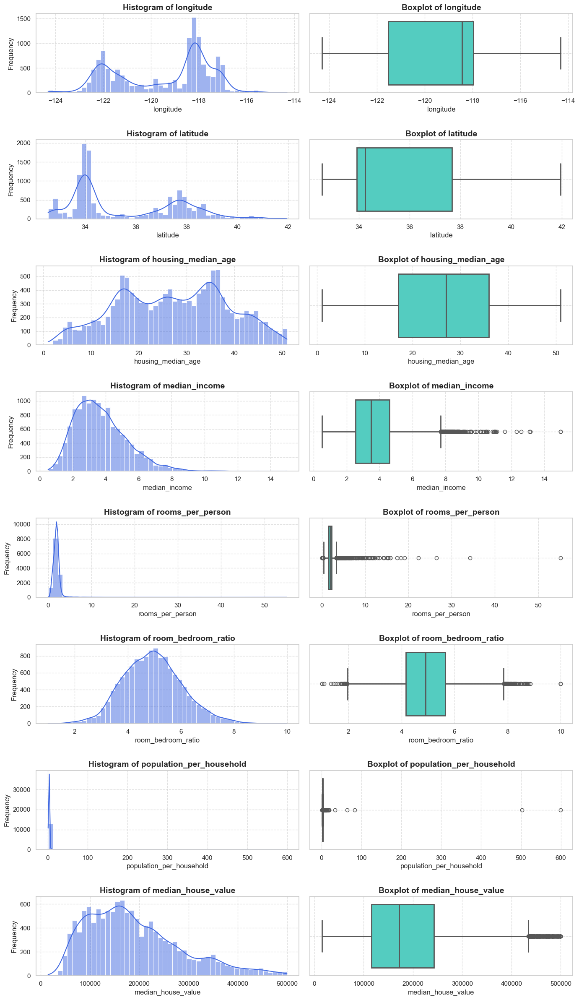

In [880]:
hist_color = '#4169E1'
box_color = '#40E0D0'

plt.figure(figsize=(14, len(numerical) * 3))

for index, col in enumerate(numerical):
    # Histogram
    plt.subplot(len(numerical), 2, index * 2 + 1)
    sns.histplot(data_FE[col], kde=True, color=hist_color, bins=50)
    plt.title(f'Histogram of {col}', size=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

    # Boxplot
    plt.subplot(len(numerical), 2, index * 2 + 2)
    sns.boxplot(x=data_FE[col], color=box_color, linewidth=2)
    plt.title(f'Boxplot of {col}', size=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(h_pad=2.5)
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Fitur `rooms_per_person` dan `population_per_household` memiliki distribusi yang sangat *positive skewed*
- Target `median_house_value` juga memiliki distribusi yang *positive skewed*

Berdasarkan insight diatas, fitur dan target dengan distribusi yang sangat *positive skewed* memiliki potensi mengganggu model dalam menentukan prediksi. Salah satu metode dalam menangani hal tersebut adalah dengan menggunakan transformasi logaritmik. Untuk fitur, transformasi logaritmik dapat membantu performa model yang mengasumsikan data input terdistribusi normal seperti Linear Regression. Selain itu, dengan menggunakan transformasi logaritmik, variansi dalam fitur dapat lebih stabil sehingga kinerja model dapat meningkat.

Bagi target, transformasi logaritmik dapat mengurangi outlier yang besar pada variabel tersebut. Hal ini akan sangat berguna dikarenakan nilai ekstrim yang banyak dapat mengganggu prediksi model.

Akan dilakukan pengecekkan nilai *skewness* untuk masing-masing kolom..

In [687]:
# Cek skewness
numerical = data_FE.drop(columns=['ocean_proximity']).columns
skew_value = []

for col in numerical:
    skew_value.append({'Numerical Column': col, 'Skewness Value': round(data_FE[col].skew(), 3)})

pd.DataFrame(skew_value).sort_values('Skewness Value', ascending=False)

,Numerical Column,Skewness Value
6,population_per_household,77.298
4,rooms_per_person,16.592
3,median_income,0.878
8,median_house_value,0.837
7,longitude_per_latitude,0.534
1,latitude,0.530
5,room_bedroom_ratio,0.223
2,housing_median_age,-0.060
0,longitude,-0.352


Berdasarkan tabel diatas, didapat insight:
- fitur `population_per_household` dan `rooms_per_person` memiliki nilai skewness yang sangat tinggi (positif, lebih dari 1)
- fitur `median_income` dan target `median_house_value` memiliki nilai skewness yang tinggi (positif, mendekati 1)

**Outliers**

In [688]:
outlier_data = []

numerical = [var for var in data_FE.columns if data_FE[var].dtypes not in ['object']]

for column in numerical:
    outlier_result, lower_bound, upper_bound = calculate_outliers(data_FE, column)
    total_outlier = len(outlier_result)
    outlier_percentage = round(total_outlier / len(data_FE[column]) * 100, 2)
    outlier_data.append([column, total_outlier, outlier_percentage, lower_bound, upper_bound])

outlier_df = pd.DataFrame(outlier_data, columns=["Column", "Total Outliers", "Percentage (%)", "Lower Bound", "Upper Bound"])
outlier_df

,Column,Total Outliers,Percentage (%),Lower Bound,Upper Bound
0,longitude,0,0.00,-126.870000,-112.630000
1,latitude,0,0.00,28.295000,43.295000
2,housing_median_age,0,0.00,-11.500000,64.500000
3,median_income,206,1.60,-0.560637,7.712262
4,rooms_per_person,290,2.25,0.376685,3.356519
5,room_bedroom_ratio,124,0.96,1.960511,7.853010
6,population_per_household,427,3.32,1.181741,4.592886
7,longitude_per_latitude,0,0.00,-3.848182,-2.872099
8,median_house_value,274,2.13,-75500.000000,434100.000000


Berdasarkan pengecekkan outlier diatas, dapat dilihat persentase outlier fitur berada dalam range 0.96% sampai 6.23%.

**Correlation**

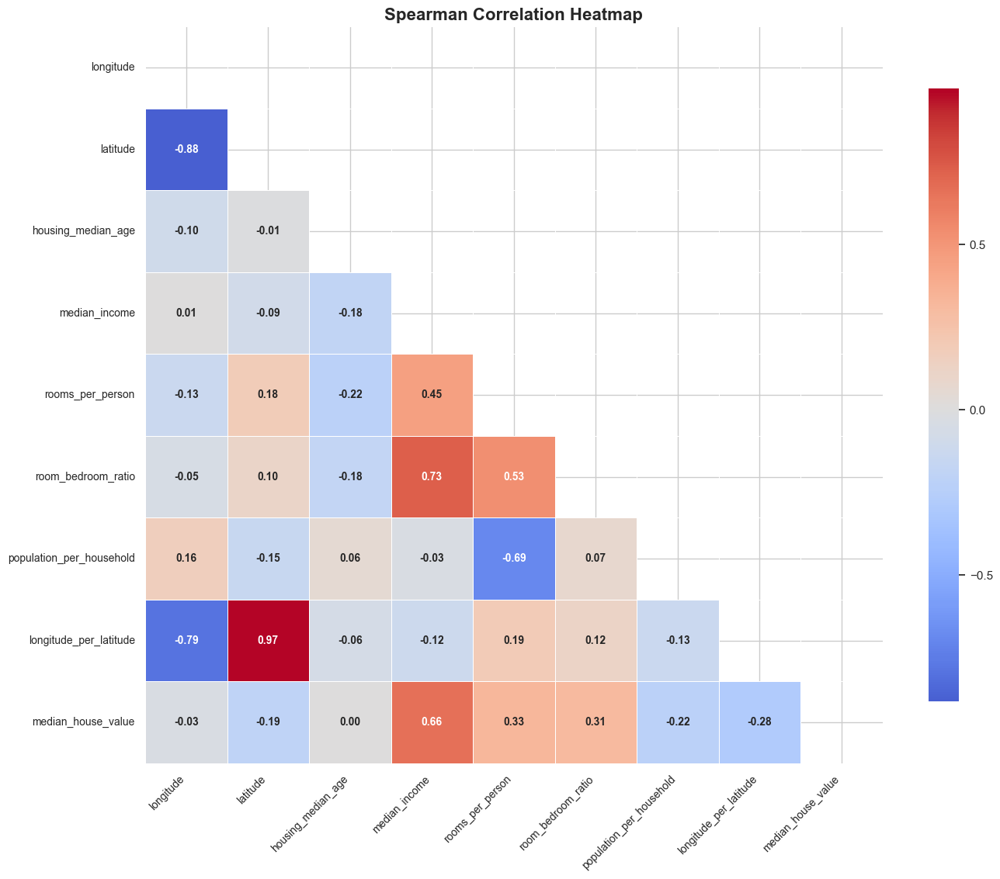

In [689]:
plt.figure(figsize=(14, 12))

corr_matrix = data_FE.corr(method='spearman', numeric_only=True)

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, 
            mask=mask, 
            annot=True, 
            fmt=".2f", 
            cmap='coolwarm', 
            center=0, 
            square=True, 
            linewidths=.5, 
            cbar_kws={"shrink": .75, "ticks": [-1, -0.5, 0, 0.5, 1]},
            annot_kws={"size": 10, "weight": "bold"})

plt.title('Spearman Correlation Heatmap', size=16, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

plt.show()

---
### **6.** ***MODELLING***

In [856]:
# Import libraries
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, KFold

from sklearn.preprocessing import OneHotEncoder, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.compose import TransformedTargetRegressor
from lightgbm import LGBMRegressor

from sklearn.preprocessing import RobustScaler

from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

from sklearn.base import BaseEstimator, TransformerMixin, OneToOneFeatureMixin
from scipy.stats.mstats import winsorize
from typing import Literal

#### Data Preparation

Berdasarkan beberapa analisis diatas, beberapa hal yang akan diterapkan dalam modelling adalah:
1. **Encoding fitur kategorikal**

Metode encoding yang akan digunakan adalah OneHotEncoder dikarenakan kardinalitas fitur yang rendah (unique value hanya 4). Proses ini bertujuan untuk mengubah data kategorikal integer menjadi boolean (true false) dimana setiap data kategori unik akan di-expand menjadi kolom atau parameter baru. Akan digunakan sejumlah k dummy variabel. Hal ini dikarenakan kita akan menggunakan tree based machine learning model & feature selection. Dimana hal tersebut tidak akan maksimal jika kehilangan 1 variabel (menggunakan k-1 dummy variabel)

2. **Data Scaling**

Pada pemodelan kali ini, akan dicoba skema scaling seperti berikut:
- None: Tidak dilakukan scaling
- RobustScaler: Digunakan karena fitur-fitur pada data tidak terdistribusi normal dan memiliki data outlier
- log1p: Digunakan karena terdapat fitur yang sangat *positive skewed*
- Power Transformer: Digunakan dengan metode yeo-johnson karena terdapat data bernilai negatif pada kolom `longitude`

3. **Outlier Handling**
Pada pemodelan kali ini, akan dicoba skema outlier handling seperti berikut:
- None: Tidak dilakukan outlier handling
- Winsorizing: dilakukan dengan limit 1%

Winsorizing merupakan salah satu metode yang dilakukan untuk mengatasi outlier. Dikarenakan outlier pada dataset memiliki nilai yang signifikan (diatas 5%), menghapus nilai outlier dapat menghilangkan informasi pada dataset yang signifikan pula. Cara kerja winsorizing adalah dengan membatasi nilai ekstrim pada dataset dengan treshold tertentu dan mengganti nilai ekstrim tersebut dengan percentil pada treshold yang ditentukan.

Secara garis besar, proses pemodelan kali ini memiliki proses:

<div align="center">

| Pipeline Num | Feature Generator and Selector | Scaler log1p | Scaler | Outlier Handling |
| --- | --- | --- | --- | --- | 
| Pipeline 1 | True | True, None | True | True | RobustScaler, None | Winsorize, None |
| Pipeline 2 | True | None | RobustScaler, PowerTransformer, None | Winsorize, None |
| Pipeline 3 | None | None | RobustScaler, PowerTransformer, None | Winsorize, None |

</div>

Dengan dilakukannya kombinasi pemodelan diatas, diharapkan model prediksi yang dihasilkan dapat optimal.

In [862]:
# Encoding
transformer = ColumnTransformer([
    ('OneHotEncoder', OneHotEncoder(handle_unknown='ignore'), ['ocean_proximity'])
], remainder='passthrough')

In [857]:
# Outlier Handling
def winsorize_with_pandas(s, limits):
    return s.clip(lower=s.quantile(limits[0], interpolation='lower'), 
                  upper=s.quantile(1-limits[1], interpolation='higher'))

class HandlingOutliers(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None):
        self.columns = columns
        
    def fit(self, X, y=None):
        self.feature_names_in_ = X.columns
        return self
    
    def transform(self, X, y=None):
        data = pd.DataFrame(X, columns=self.feature_names_in_)
        for col in self.columns:
            data[col] = winsorize_with_pandas(data[col], limits=(0.01, 0.01))
        return data

In [858]:
# Feature generator
class FeaturesGeneratorSelector(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        self.feature_names_in_ = X.columns
        return self
    
    def transform(self, X, y=None):
        data = pd.DataFrame(X, columns=self.feature_names_in_)
        data['rooms_per_person'] = data['total_rooms'] / data['population']
        data['room_bedroom_ratio'] = data['total_rooms'] / data['total_bedrooms']
        data['population_per_household'] = data['population'] / data['households']
        data.drop(columns=['total_bedrooms', 'population', 'total_rooms', 'households'], inplace=True)
        return data

In [859]:
# Log1p Transform
class Log1pTransform(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None):
        self.columns = columns
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        data = X.copy()
        for col in self.columns:
            data[col] = np.log1p(data[col])
        return data

#### Data Splitting
Akan digunakan rasio 70:30 dalam pembagian dataset menjadi *train set* dan juga *test set*

In [693]:
# Data splitting
# Define feature and target
data_model = data.copy()

X = data_model.drop(columns=['median_house_value'])
y = data_model['median_house_value']

# splitting
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

### Benchmark *Do Nothing*
Akan dilakukan pemodelan tanpa melakukan feature generator selector dan juga scaler log1p untuk melihat kondisi prediksi pada dataset awal.

In [694]:
# Define algoritma yang digunakan
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=1)
rf = RandomForestRegressor(random_state=1)
xgb = XGBRegressor(random_state=1)
ad = AdaBoostRegressor(random_state=1)
gbr = GradientBoostingRegressor(random_state=1)
lgbm = LGBMRegressor(random_state=1)

# Define log-transformed models using TransformedTargetRegressor
log_lr = TransformedTargetRegressor(lr, func=np.log, inverse_func=np.exp)
log_knn = TransformedTargetRegressor(knn, func=np.log, inverse_func=np.exp)
log_dt = TransformedTargetRegressor(dt, func=np.log, inverse_func=np.exp)
log_rf = TransformedTargetRegressor(rf, func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)
log_ad = TransformedTargetRegressor(ad, func=np.log, inverse_func=np.exp)
log_gbr = TransformedTargetRegressor(gbr, func=np.log, inverse_func=np.exp)
log_lgbm = TransformedTargetRegressor(lgbm, func=np.log, inverse_func=np.exp)

# Kandidat algoritma
models = [lr, knn, dt, rf, xgb, ad, gbr, lgbm, log_lr, log_knn, log_dt, log_rf, log_xgb, log_ad, log_gbr, log_lgbm]

score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []

# Mencari algoritma terbaik berdasarkan tiap metrics
for i in models:
    
    crossval = KFold(n_splits=5, shuffle=True, random_state=1)

    estimator = Pipeline([
        ('preprocessing', transformer),
        ('scaler', RobustScaler()),
        ('model', i)
    ])

    # RMSE
    model_cv_rmse = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_root_mean_squared_error', 
        error_score='raise'
        )

    print(model_cv_rmse, i)

    score_rmse.append(model_cv_rmse)
    nilai_mean_rmse.append(model_cv_rmse.mean())
    nilai_std_rmse.append(model_cv_rmse.std())

    # MAE
    model_cv_mae = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_error', 
        error_score='raise'
        )

    print(model_cv_mae, i)

    score_mae.append(model_cv_mae)
    nilai_mean_mae.append(model_cv_mae.mean())
    nilai_std_mae.append(model_cv_mae.std())

    # MAPE
    model_cv_mape = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_percentage_error', 
        error_score='raise'
        )

    print(model_cv_mape, i)

    score_mape.append(model_cv_mape)
    nilai_mean_mape.append(model_cv_mape.mean())
    nilai_std_mape.append(model_cv_mape.std())

[-58297.8630329  -58903.40075532 -60517.29080117 -58246.75890486
 -58848.46338711] LinearRegression()
[-42795.82519423 -43229.70921199 -43272.97225305 -42186.21531632
 -43374.8945616 ] LinearRegression()
[-0.26278569 -0.2580176  -0.26802054 -0.26113513 -0.2605352 ] LinearRegression()
[-55780.74539822 -56450.24612792 -55331.87456969 -55496.23944224
 -53790.89808471] KNeighborsRegressor()
[-39628.93507214 -39426.84794673 -38512.77469478 -39191.78690344
 -38095.19478357] KNeighborsRegressor()
[-0.23694389 -0.22113289 -0.22874167 -0.23152902 -0.22144266] KNeighborsRegressor()
[-65616.34530046 -64938.72690936 -66592.97781886 -62518.36229706
 -64652.55399924] DecisionTreeRegressor(random_state=1)
[-44646.72641509 -43643.61875694 -44981.13207547 -42184.62874584
 -43644.78412875] DecisionTreeRegressor(random_state=1)
[-0.26892535 -0.24156535 -0.25842046 -0.24890363 -0.25472582] DecisionTreeRegressor(random_state=1)
[-45785.0361264  -47427.4371399  -48239.09250991 -45973.5148117
 -46437.4193440

In [695]:
# Evaluasi hasil dari kandidat algoritma yang digunakan
pd.DataFrame({
    'Model': ['Linear Regression', 'KNN Regressor', 'DecisionTree Regressor', 'RandomForest Regressor', 'XGBoost Regressor', 'AdaBoost Regressor', 'GradientBoosting Regressor', 'LGBM Regressor', 'Log-Linear Regression', 'Log-KNN Regressor', 'Log-DecisionTree Regressor', 'Log-RandomForest Regressor', 'Log-XGBoost Regressor', 'Log-AdaBoost Regressor', 'Log-GradientBoosting Regressor', 'Log-LGBM Regressor'],
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

,Model,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
0,Linear Regression,-58962.755376,823.152330,-42971.923307,439.958513,-0.262099,0.003334
1,KNN Regressor,-55370.000725,877.108463,-38971.107880,577.308915,-0.227958,0.006052
2,DecisionTree Regressor,-64863.793265,1349.644197,-43820.178024,976.519758,-0.254508,0.009188
3,RandomForest Regressor,-46772.499986,927.963095,-31755.979553,313.746630,-0.189091,0.005280
4,XGBoost Regressor,-44621.462129,1219.926592,-30349.539145,691.507195,-0.179443,0.003945
5,AdaBoost Regressor,-74992.312128,4030.795750,-64065.379943,4712.945882,-0.470421,0.052103
6,GradientBoosting Regressor,-49930.319720,878.059864,-35338.824859,434.721539,-0.210322,0.004551
7,LGBM Regressor,-43986.862779,773.438576,-29951.895835,406.197740,-0.177263,0.004491
8,Log-Linear Regression,-65077.367837,4516.119512,-42439.690471,344.797679,-0.239684,0.001876
9,Log-KNN Regressor,-55671.961946,988.854225,-38432.739393,609.390058,-0.216202,0.005150


Berdasarkan pemodelan *Do Nothing* atau pemodelan tahap awal diatas, didapat insight:
- Secara garis besar, keseluruhan algoritma **memiliki performa lebih bagus** apabila menggunakan TransformedTargetRegressor
- Nilai RMSE cenderung lebih tinggi dibandingkan dengan MAE. Hal ini dikarenakan nilai error pada RMSE dikuadratkan terlebih dahulu baru dicari rata-ratanya. Dengan kesimpulan RMSE memberikan beban yang lebih besar untuk data yang memiliki outlier
- Dari pemodelan pertama, dapat dilihat bahwa algoritma Log-LGBM Regressor dan juga Log-XGBoost Regressor memiliki performa yang paling baik diantara algoritma lainnya yang ditandai dengan nilai RMSE, MAE, dan juga MAPE yang lebih rendah

### Benchmark Model
Setelah dilakukan pemodelan tahap pertama, akan dilakukan pemodelan dengan menambahkan fitur-fitur baru dan juga mengaplikasikan log1p pada fitur-fitur yang memiliki tingkat *positive skewness* yang signifikan

In [860]:
# Define models
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=1)
rf = RandomForestRegressor(random_state=1)
xgb = XGBRegressor(random_state=1)
ad = AdaBoostRegressor(random_state=1)
gbr = GradientBoostingRegressor(random_state=1)
lgbm = LGBMRegressor(random_state=1)

# Define log-transformed models using TransformedTargetRegressor
log_lr = TransformedTargetRegressor(lr, func=np.log, inverse_func=np.exp)
log_knn = TransformedTargetRegressor(knn, func=np.log, inverse_func=np.exp)
log_dt = TransformedTargetRegressor(dt, func=np.log, inverse_func=np.exp)
log_rf = TransformedTargetRegressor(rf, func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)
log_ad = TransformedTargetRegressor(ad, func=np.log, inverse_func=np.exp)
log_gbr = TransformedTargetRegressor(gbr, func=np.log, inverse_func=np.exp)
log_lgbm = TransformedTargetRegressor(lgbm, func=np.log, inverse_func=np.exp)

# Outlier
outlier = {
    'None': None,
    'Winsorize':HandlingOutliers(columns=['median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household'])
}

# Scaling data
scalerP1 = {
    'None': None,
    'RobustScaler': RobustScaler()
}

scalerP2 = {
    'None': None,
    'RobustScaler':RobustScaler(),
    'PowerTransformer': PowerTransformer(method='yeo-johnson')
}

# models
models = {
    'Linear Regression': lr,
    'KNN Regressor': knn,
    'DecisionTree Regressor': dt,
    'RandomForest Regressor': rf,
    'XGBoost Regressor': xgb,
    'AdaBoost': ad,
    'GradientBoost': gbr,
    'LGBM Regressor': lgbm,
    'Log-Linear Regression': log_lr,
    'Log-KNN Regressor': log_knn,
    'Log-DecisionTree Regressor': log_dt,
    'Log-RandomForest Regressor': log_rf,
    'Log-XGBoost Regressor': log_xgb,
    'Log-AdaBoost': log_ad,
    'Log-GradientBoost': log_gbr,
    'Log-LGBM Regressor': log_lgbm
}

nama_model = []
outlier_handler = []
log1p_kolom = []
nama_scaler = []

score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []

# Pipeline 1 (hanya menggunakan logaritma pada fitur yang sangat skewed positif)
for model_name, model in models.items():
    for outlier_handling_name, outlier_handling in outlier.items():
        for scaler_name, scaler in scalerP1.items():

            crossval = KFold(n_splits=5, shuffle=True, random_state=1)

            estimator1 = Pipeline([
                ('generate_new_features', FeaturesGeneratorSelector()),
                ('outlier_handling', outlier_handling),
                ('log1p', Log1pTransform(columns=['population_per_household', 'rooms_per_person', 'median_income'])),
                ('encoder', transformer),
                ('scaler',scaler),
                ('model', model)
            ])

            nama_model.append(model_name)
            outlier_handler.append(outlier_handling_name)
            log1p_kolom.append('True')
            nama_scaler.append(scaler_name)

            estimator1.steps = [step for step in estimator1.steps if step[1] is not None]

            # RMSE
            model_cv_rmse = cross_val_score(
                estimator1, 
                X_train, 
                y_train, 
                cv=crossval, 
                scoring='neg_root_mean_squared_error', 
                error_score='raise'
                )

            print(f'RMSE for {model_name}, {outlier_handling_name}, {scaler_name}: {model_cv_rmse}')

            score_rmse.append(model_cv_rmse)
            nilai_mean_rmse.append(model_cv_rmse.mean())
            nilai_std_rmse.append(model_cv_rmse.std())

            # MAE
            model_cv_mae = cross_val_score(
                estimator1, 
                X_train, 
                y_train, 
                cv=crossval, 
                scoring='neg_mean_absolute_error', 
                error_score='raise'
                )

            print(f'MAE for {model_name}, {outlier_handling_name}, {scaler_name}: {model_cv_mae}')

            score_mae.append(model_cv_mae)
            nilai_mean_mae.append(model_cv_mae.mean())
            nilai_std_mae.append(model_cv_mae.std())

            # MAPE
            model_cv_mape = cross_val_score(
                estimator1, 
                X_train, 
                y_train, 
                cv=crossval, 
                scoring='neg_mean_absolute_percentage_error', 
                error_score='raise'
                )

            print(f'MAPE for {model_name}, {outlier_handling_name}, {scaler_name}: {model_cv_mape}')

            score_mape.append(model_cv_mape)
            nilai_mean_mape.append(model_cv_mape.mean())
            nilai_std_mape.append(model_cv_mape.std())

# Pipeline 2 (menggunakan power transformer)
for model_name, model in models.items():
    for outlier_handling_name, outlier_handling in outlier.items():
        for scaler_name, scaler in scalerP2.items():

            crossval = KFold(n_splits=5, shuffle=True, random_state=1)

            estimator2 = Pipeline([
                ('generate_new_features', FeaturesGeneratorSelector()),
                ('outlier_handling', outlier_handling),
                ('encoder', transformer),
                ('scaler',scaler),
                ('model', model)
            ])

            nama_model.append(model_name)
            outlier_handler.append(outlier_handling_name)
            log1p_kolom.append('False')
            nama_scaler.append(scaler_name)

            estimator2.steps = [step for step in estimator2.steps if step[1] is not None]

            # RMSE
            model_cv_rmse = cross_val_score(
                estimator2, 
                X_train, 
                y_train, 
                cv=crossval, 
                scoring='neg_root_mean_squared_error', 
                error_score='raise'
                )

            print(f'RMSE for {model_name}, {outlier_handling_name}, {scaler_name}: {model_cv_rmse}')

            score_rmse.append(model_cv_rmse)
            nilai_mean_rmse.append(model_cv_rmse.mean())
            nilai_std_rmse.append(model_cv_rmse.std())

            # MAE
            model_cv_mae = cross_val_score(
                estimator2, 
                X_train, 
                y_train, 
                cv=crossval, 
                scoring='neg_mean_absolute_error', 
                error_score='raise'
                )

            print(f'MAE for {model_name}, {outlier_handling_name}, {scaler_name}: {model_cv_mae}')

            score_mae.append(model_cv_mae)
            nilai_mean_mae.append(model_cv_mae.mean())
            nilai_std_mae.append(model_cv_mae.std())

            # MAPE
            model_cv_mape = cross_val_score(
                estimator2, 
                X_train, 
                y_train, 
                cv=crossval, 
                scoring='neg_mean_absolute_percentage_error', 
                error_score='raise'
                )

            print(f'MAPE for {model_name}, {outlier_handling_name}, {scaler_name}: {model_cv_mape}')

            score_mape.append(model_cv_mape)
            nilai_mean_mape.append(model_cv_mape.mean())
            nilai_std_mape.append(model_cv_mape.std())

RMSE for Linear Regression, None, None: [-60216.2272325  -60236.0376698  -59848.02874709 -58967.33148908
 -61122.97659615]
MAE for Linear Regression, None, None: [-44939.19506104 -44503.00554939 -44436.31409545 -43954.84295228
 -45388.09600444]
MAPE for Linear Regression, None, None: [-0.28295283 -0.2679844  -0.27929865 -0.28129779 -0.28026575]
RMSE for Linear Regression, None, RobustScaler: [-60216.29861739 -60235.27952868 -59848.23319052 -58967.24675786
 -61120.01979857]
MAE for Linear Regression, None, RobustScaler: [-44939.36015538 -44504.09100999 -44436.79023307 -43954.77580466
 -45389.98501665]
MAPE for Linear Regression, None, RobustScaler: [-0.28295393 -0.26798989 -0.27930353 -0.28129361 -0.28031705]
RMSE for Linear Regression, Winsorize, None: [-60103.28267938 -59423.70809093 -59377.86245977 -58674.68306622
 -60215.75939065]
MAE for Linear Regression, Winsorize, None: [-44830.36903441 -44167.59156493 -44282.99889012 -43738.67147614
 -44941.35016648]
MAPE for Linear Regression,

In [864]:
results_df = pd.DataFrame({
    'Model': nama_model,
    'OutlierHandling': outlier_handler,
    'Individual_LogScaler': log1p_kolom,
    'Scaler': nama_scaler,
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

results_df.sort_values('Mean_MAPE',ascending=False).head(20)

,Model,OutlierHandling,Individual_LogScaler,Scaler,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
154,Log-LGBM Regressor,None,False,None,-42916.656635,1148.718573,-28083.478117,541.038361,-0.156046,0.004271
60,Log-LGBM Regressor,None,True,None,-42916.776323,1148.932055,-28083.610182,541.141374,-0.156046,0.004270
155,Log-LGBM Regressor,None,False,RobustScaler,-42888.350804,1209.615528,-28129.552030,599.362634,-0.156357,0.003693
61,Log-LGBM Regressor,None,True,RobustScaler,-42888.694829,1209.207238,-28130.014370,599.229666,-0.156358,0.003693
157,Log-LGBM Regressor,Winsorize,False,None,-42919.594198,1137.252622,-28127.026845,606.829677,-0.156501,0.004451
62,Log-LGBM Regressor,Winsorize,True,None,-42919.591793,1137.305701,-28127.181761,607.213468,-0.156502,0.004452
158,Log-LGBM Regressor,Winsorize,False,RobustScaler,-43092.487881,1267.917795,-28225.273742,568.696678,-0.156725,0.004643
63,Log-LGBM Regressor,Winsorize,True,RobustScaler,-43092.683492,1267.826271,-28226.214038,569.443879,-0.156731,0.004650
156,Log-LGBM Regressor,None,False,PowerTransformer,-43322.748494,1309.855786,-28454.138803,719.735478,-0.157620,0.004879
159,Log-LGBM Regressor,Winsorize,False,PowerTransformer,-43468.938467,1414.406624,-28451.850724,822.376626,-0.157706,0.004862


Berdasarkan pemodelan diatas, dapat dilihat model `Log-LGBM` dan `Log-XGBoost` memiliki performa yang paling baik diantara algoritma lainnya. Untuk nilai MAPE dari kedua model tersebut **turun sebesar 1%** dari pemodelan pertama. Berikut adalah konfigurasi 2 model yang digunakan sebagai benchmark model

<div align="center">

| Model | Feature Generator and Selector | Scaler log1p | Scaler | Outlier Handling | MAE (Validation) | MAPE (Validation)
| --- | --- | --- | --- | --- | --- | --- | 
| Log-LGBM | True | False | None | None | 0.156046 | 28083.478117 |
| Log-XGBoost | True | False | None | RobustScaler | 0.157978 | 28396.044320 |


</div>


#### Prediction
Akan digunakan 2 model terbaik untuk prediksi

In [866]:
# Benchmark 2 model terbaik
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)
log_lgbm = TransformedTargetRegressor(lgbm, func=np.log, inverse_func=np.exp)

model_list = ['Log-XGBoost Regressor', 'Log-LGBM Regressor']

crossval = KFold(n_splits=5, shuffle=True, random_state=1)

score_mae_train = []
score_mae_validation = []
score_mae_test = []

# Prediksi pada test set model 1 (XGBoost)
model1 = Pipeline([
    ('generate_new_features', FeaturesGeneratorSelector()),
    # ('outlier_handling', HandlingOutliers(columns=['median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household'])),
    # ('log1p', Log1pTransform(columns=['population_per_household', 'rooms_per_person', 'median_income'])),
    ('encoder', transformer),
    # ('scaler', RobustScaler()),
    ('model', log_xgb)
])

model1.fit(X_train, y_train)
y_pred_xgb_0 = model1.predict(X_test)
y_pred_xgb_train = model1.predict(X_train)
score_mae_test.append(mean_absolute_error(y_test, y_pred_xgb_0))
score_mae_train.append(mean_absolute_error(y_train, y_pred_xgb_train))

score_mae_validation.append(np.abs(cross_val_score(
    model1, 
    X_train, 
    y_train, 
    cv=crossval, 
    scoring='neg_mean_absolute_error', 
    error_score='raise'
    ).mean()))

# Prediksi pada test set model 2 (LGBM)
model4 = Pipeline([
    ('generate_new_features', FeaturesGeneratorSelector()),
    # ('outlier_handling', HandlingOutliers(columns=['median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household'])),
    ('encoder', transformer),
    ('scaler', RobustScaler()),
    ('model', log_lgbm)
])

model4.fit(X_train, y_train)
y_pred_lgbm_0 = model4.predict(X_test)
y_pred_lgbm_train = model4.predict(X_train)
score_mae_test.append(mean_absolute_error(y_test, y_pred_lgbm_0))
score_mae_train.append(mean_absolute_error(y_train, y_pred_lgbm_train))

score_mae_validation.append(np.abs(cross_val_score(
    model4, 
    X_train, 
    y_train, 
    cv=crossval, 
    scoring='neg_mean_absolute_error', 
    error_score='raise'
    ).mean()))

score_before_tuning = pd.DataFrame({'MAE (Train Set)': score_mae_train, 'MAE (Validation Set)': score_mae_validation,'MAE (Test Set)': score_mae_test}, index=model_list)
score_before_tuning

,MAE (Train Set),MAE (Validation Set),MAE (Test Set)
Log-XGBoost Regressor,15435.212536,28396.04432,29010.800753
Log-LGBM Regressor,23302.337931,28129.55203,29026.609921


Berdasarkan hasil prediksi diatas, didapat insight:
- Log-XGBoost Regressor menunjukkan perbedaan yang cukup besar antara MAE pada Train Set dan Validation/Test Set. Nilai MAE yang jauh lebih rendah pada Train Set menunjukkan bahwa model ini mengalami overfitting terhadap data train, namun kinerjanya menurun pada Validation dan Test Set. Hal ini merupakan indikasi overfitting, di mana model belajar terlalu detail pada data train hingga kehilangan generalisasi pada data baru.
- Log-LGBM Regressor juga menunjukkan indikasi overfitting, tetapi tidak seburuk Log-XGBoost. MAE pada Train Set (23302.34) lebih rendah dibandingkan MAE pada Validation Set (28129.55) dan Test Set (29026.61). Namun, perbedaan ini tidak sebesar perbedaan pada Log-XGBoost, menunjukkan bahwa meskipun Log-LGBM juga mengalami overfitting, model ini masih lebih baik dalam hal generalisasi dibandingkan Log-XGBoost.

#### `Hyperparameter Tuning`
Hyperparameter tuning akan dilakukan untuk dua model terbaik saat benchmark yaitu `Log-LGBM` dan juga `Log-XGBoost` dengan kombinasi tambahan dari pipeline/skema pemodelan yang terlampir pada sub-bab sebelumnya.

**XGBoost**

Pada tuning model XGBoost, akan diutamakan **membuat model yang general** terlebih dahulu baru dilakukan upaya untuk menurunkan metrik MAE. Beberapa parameter yang akan di tuning:

<div align="center">

| Nama Kolom | Deskripsi & Penjelasan Kolom | Default |
| --- | --- | --- |
| reg_lambda | L2 regularization. Semakin besar nilainya, semakin konservatif/simpel modelnya | 1 |
| max_depth | Kedalaman tree | 6 |
| learning_rate | Step size shrinkage yang digunakan untuk mencegah overfitting | 0.3 |
| n_estimators | Jumlah trees di dalam forest  | 100 |
| subsample | Jumlah baris tiap pohon (% dari total baris train set) | 1 |
| gamma | Sebuah node yang di split hanya ketika hasil splitting memberikan positive reduction | 0 |
| colsample_bytree | Jumlah feature yang digunakan untuk tiap pohon (% dari total kolom train set) | 1 |
| reg_alpha | L1 regularization. Semakin besar nilainya, semakin konservatif/simpel modelnya | 1 |
| colsample_bylevel | Jumlah feature yang digunakan untuk tiap level dalam pohon decision tree (% dari total feature) | 1 |
| min_child_weight | Minimum jumlah data yang diperlukan di leaf node. Semakin besar nilainya, model akan lebih konservatif. | 1 |

</div>

RandomizedSearchCV:
- Digunakan `n_iter` sebanyak 300 dengan harapan dapat menangkap model terbaik
- Digunakan `n_jobs=-1` yang artinya akan digunakan seluruh prosessor pada komputer
- Digunakan `random_state=1`
- Digunakan scoring `neg_mean_absolute_error` sebagai scoring yang akan dioptimasi
- Untuk cross validation, digunakan K-Folds cross-validator dengan number of folds sebanyak 5 (`n_splits=5`, `shuffle=True`) yang gunanya untuk mengacak data sebelum membagi ke beberapa kelompok. Digunakan `random_state=1`

**Tuning pada skema pipeline 1**

In [881]:
# Outlier
outlier = [None, HandlingOutliers(columns=['median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household'])]

# Scaling data
scalerP1 = [None, RobustScaler()]

# Hyperparameter space untuk XGBoost regression
hyperparam_space_xgb = {
    'outlier_handling':outlier,
    'scaler':scalerP1,
    'model__regressor__max_depth': [7, 11],
    'model__regressor__learning_rate': [0.01, 0.3],
    'model__regressor__n_estimators': [530, 730],
    'model__regressor__subsample': [0.7, 0.8, 0.9],
    'model__regressor__gamma': [0.2, 0.3],
    'model__regressor__colsample_bytree': [0.7, 0.8, 0.9],
    'model__regressor__colsample_bylevel': [0.7, 0.8, 0.9],
    'model__regressor__reg_lambda': [1, 1.5, 2],
    'model__regressor__reg_alpha': [0, 0.1, 0.3, 0.5],
    'model__regressor__min_child_weight': [1, 3, 5]
}

In [882]:
# Benchmark model dengan hyperparameter tuning
xgb = TransformedTargetRegressor(XGBRegressor(random_state=1), func=np.log, inverse_func=np.exp)

# Define cross-validation
crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define the pipeline
estimator1_xgb = Pipeline([
    ('generate_new_features', FeaturesGeneratorSelector()),
    ('outlier_handling', 'passthrough'),  # Placeholder, overridden in RandomizedSearchCV
    ('log1p', Log1pTransform(columns=['population_per_household', 'rooms_per_person', 'median_income'])),
    ('encoder', transformer),
    ('scaler', 'passthrough'),  # Placeholder, overridden in RandomizedSearchCV
    ('model', xgb)
])

# Hyperparameter tuning
random_xgb1 = RandomizedSearchCV(
    estimator1_xgb, 
    param_distributions=hyperparam_space_xgb,
    n_iter=300,
    cv=crossval, 
    scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs=-1,
    refit='neg_mean_absolute_error',
    random_state=1,
    error_score='raise'  
)

random_xgb1.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(steps=[('generate_new_features',
                                              FeaturesGeneratorSelector()),
                                             ('outlier_handling',
                                              'passthrough'),
                                             ('log1p',
                                              Log1pTransform(columns=['population_per_household',
                                                                      'rooms_per_person',
                                                                      'median_income'])),
                                             ('encoder',
                                              ColumnTransformer(remainder='passthrou...
                                        'model__regressor__subsample': [0.7,
                                                                        0.8,
                                                                        0.9],
                                        'outlier_handling': [None,
                                                             HandlingOutliers(columns=['median_income',
                                                                                       'rooms_per_person',
                                                                                       'room_bedroom_ratio',
                                                                                       'population_per_household'])],
                                        'scaler': [None, RobustScaler()]},
                   random_state=1, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [883]:
print(f'Best parameters for XGBoost Regressor: {random_xgb1.best_params_}')
print(f'Best MAE score for XGBoost Regressor: {random_xgb1.best_score_}')
pd.DataFrame(random_xgb1.cv_results_).sort_values(by='rank_test_neg_mean_absolute_error').head()

Best parameters for XGBoost Regressor: {'scaler': None, 'outlier_handling': None, 'model__regressor__subsample': 0.8, 'model__regressor__reg_lambda': 1.5, 'model__regressor__reg_alpha': 0, 'model__regressor__n_estimators': 730, 'model__regressor__min_child_weight': 5, 'model__regressor__max_depth': 11, 'model__regressor__learning_rate': 0.01, 'model__regressor__gamma': 0.2, 'model__regressor__colsample_bytree': 0.8, 'model__regressor__colsample_bylevel': 0.9}
Best MAE score for XGBoost Regressor: -28498.308908070896


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_scaler,param_outlier_handling,param_model__regressor__subsample,param_model__regressor__reg_lambda,param_model__regressor__reg_alpha,param_model__regressor__n_estimators,...,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,split0_test_neg_mean_absolute_percentage_error,split1_test_neg_mean_absolute_percentage_error,split2_test_neg_mean_absolute_percentage_error,split3_test_neg_mean_absolute_percentage_error,split4_test_neg_mean_absolute_percentage_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
279,3.819793,0.059673,0.163924,0.015597,None,None,0.8,1.5,0.0,730,...,582.642548,1,-0.165187,-0.152983,-0.158685,-0.154011,-0.157955,-0.157764,0.004311,1
227,3.527152,0.046858,0.145090,0.011026,RobustScaler(),None,0.8,1.5,0.1,730,...,575.148602,2,-0.165321,-0.152613,-0.158951,-0.154246,-0.158260,-0.157878,0.004418,2
28,3.210604,0.362148,0.192784,0.056234,None,"HandlingOutliers(columns=['median_income', 'ro...",0.9,2.0,0.0,730,...,657.480741,3,-0.164703,-0.153576,-0.159031,-0.154026,-0.159145,-0.158096,0.004065,3
125,2.965306,0.403396,0.169864,0.066724,None,None,0.8,1.0,0.0,730,...,562.325381,4,-0.165918,-0.152761,-0.159088,-0.154680,-0.158747,-0.158239,0.004530,4
175,3.245384,0.487924,0.238598,0.033183,None,"HandlingOutliers(columns=['median_income', 'ro...",0.8,2.0,0.1,730,...,711.709897,5,-0.164979,-0.153784,-0.159040,-0.153593,-0.159863,-0.158252,0.004246,5


**Tuning pada skema pipeline 2**

In [884]:
# Outlier
outlier = [None, HandlingOutliers(columns=['median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household'])]

# Scaling data
scalerP2 = [None, RobustScaler(), PowerTransformer(method='yeo-johnson')]

# Hyperparameter space untuk XGBoost regression
hyperparam_space_xgb = {
    'outlier_handling':outlier,
    'scaler':scalerP2,
    'model__regressor__max_depth': [7, 11],
    'model__regressor__learning_rate': [0.01, 0.3],
    'model__regressor__n_estimators': [530, 730],
    'model__regressor__subsample': [0.7, 0.8, 0.9],
    'model__regressor__gamma': [0.2, 0.3],
    'model__regressor__colsample_bytree': [0.7, 0.8, 0.9],
    'model__regressor__colsample_bylevel': [0.7, 0.8, 0.9],
    'model__regressor__reg_lambda': [1, 1.5, 2],
    'model__regressor__reg_alpha': [0, 0.1, 0.3, 0.5],
    'model__regressor__min_child_weight': [1, 3, 5]
}

In [885]:
# Benchmark model dengan hyperparameter tuning
xgb = TransformedTargetRegressor(XGBRegressor(random_state=1), func=np.log, inverse_func=np.exp)

# Define cross-validation
crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define the pipeline
estimator2_xgb = Pipeline([
    ('generate_new_features', FeaturesGeneratorSelector()),
    ('outlier_handling', 'passthrough'),
    ('encoder', transformer),
    ('scaler','passthrough'),
    ('model', xgb)
])

# Hyperparameter tuning
random_xgb2 = RandomizedSearchCV(
    estimator2_xgb, 
    param_distributions=hyperparam_space_xgb,
    n_iter=300,
    cv=crossval, 
    scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs=-1,
    refit='neg_mean_absolute_error',
    random_state=1  
)

random_xgb2.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=Pipeline(steps=[('generate_new_features',
                                              FeaturesGeneratorSelector()),
                                             ('outlier_handling',
                                              'passthrough'),
                                             ('encoder',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('OneHotEncoder',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               ['ocean_proximity'])])),
                                             ('scaler', 'passthrou...
                                        'model__regressor__subsample': [0.7,
                                                                        0.8,
                                                                        0.9],
                                        'outlier_handling': [None,
                                                             HandlingOutliers(columns=['median_income',
                                                                                       'rooms_per_person',
                                                                                       'room_bedroom_ratio',
                                                                                       'population_per_household'])],
                                        'scaler': [None, RobustScaler(),
                                                   PowerTransformer()]},
                   random_state=1, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [886]:
print(f'Best parameters for XGBoost Regressor: {random_xgb2.best_params_}')
print(f'Best MAE score for XGBoost Regressor: {random_xgb2.best_score_}')
pd.DataFrame(random_xgb2.cv_results_).sort_values(by='rank_test_neg_mean_absolute_error').head()

Best parameters for XGBoost Regressor: {'scaler': RobustScaler(), 'outlier_handling': HandlingOutliers(columns=['median_income', 'rooms_per_person',
                          'room_bedroom_ratio', 'population_per_household']), 'model__regressor__subsample': 0.8, 'model__regressor__reg_lambda': 1, 'model__regressor__reg_alpha': 0, 'model__regressor__n_estimators': 730, 'model__regressor__min_child_weight': 5, 'model__regressor__max_depth': 11, 'model__regressor__learning_rate': 0.01, 'model__regressor__gamma': 0.2, 'model__regressor__colsample_bytree': 0.9, 'model__regressor__colsample_bylevel': 0.9}
Best MAE score for XGBoost Regressor: -28572.727941610014


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_scaler,param_outlier_handling,param_model__regressor__subsample,param_model__regressor__reg_lambda,param_model__regressor__reg_alpha,param_model__regressor__n_estimators,...,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,split0_test_neg_mean_absolute_percentage_error,split1_test_neg_mean_absolute_percentage_error,split2_test_neg_mean_absolute_percentage_error,split3_test_neg_mean_absolute_percentage_error,split4_test_neg_mean_absolute_percentage_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
120,4.095168,0.093169,0.180732,0.014655,RobustScaler(),"HandlingOutliers(columns=['median_income', 'ro...",0.8,1.0,0.0,730,...,561.948756,1,-0.164290,-0.153487,-0.159825,-0.154879,-0.158503,-0.158197,0.003823,1
69,4.591065,0.345915,0.306159,0.122803,RobustScaler(),"HandlingOutliers(columns=['median_income', 'ro...",0.9,1.5,0.1,730,...,648.933357,2,-0.165448,-0.153770,-0.159543,-0.154156,-0.158670,-0.158317,0.004254,2
299,2.274446,0.028325,0.081114,0.005133,None,"HandlingOutliers(columns=['median_income', 'ro...",0.8,1.0,0.1,730,...,623.672115,3,-0.165339,-0.153784,-0.159293,-0.154872,-0.158641,-0.158386,0.004069,3
39,3.571620,0.124260,0.193004,0.054722,None,"HandlingOutliers(columns=['median_income', 'ro...",0.9,1.5,0.1,530,...,662.515111,4,-0.166106,-0.154219,-0.160011,-0.154516,-0.159520,-0.158874,0.004351,6
81,3.429178,0.109570,0.147367,0.017324,RobustScaler(),None,0.9,1.0,0.3,730,...,651.385436,5,-0.165846,-0.154227,-0.160249,-0.154302,-0.159873,-0.158899,0.004336,7


**Tuning pada skema pipeline 3**

In [887]:
# Outlier
outlier = [None, HandlingOutliers(columns=['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income'])]

# Scaling data
scalerP3 = [None, RobustScaler(), PowerTransformer(method='yeo-johnson')]

# Hyperparameter space untuk XGBoost regression
hyperparam_space_xgb = {
    'outlier_handling':outlier,
    'scaler':scalerP3,
    'model__regressor__max_depth': [7, 11],
    'model__regressor__learning_rate': [0.01, 0.3],
    'model__regressor__n_estimators': [530, 730],
    'model__regressor__subsample': [0.7, 0.8, 0.9],
    'model__regressor__gamma': [0.2, 0.3],
    'model__regressor__colsample_bytree': [0.7, 0.8, 0.9],
    'model__regressor__colsample_bylevel': [0.7, 0.8, 0.9],
    'model__regressor__reg_lambda': [1, 1.5, 2],
    'model__regressor__reg_alpha': [0, 0.1, 0.3, 0.5],
    'model__regressor__min_child_weight': [1, 3, 5]
}

In [888]:
# Benchmark model dengan hyperparameter tuning
xgb = TransformedTargetRegressor(XGBRegressor(random_state=1), func=np.log, inverse_func=np.exp)

# Define cross-validation
crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define the pipeline
estimator3_xgb = Pipeline([
    ('outlier_handling', 'passthrough'),
    ('encoder', transformer),
    ('scaler','passthrough'),
    ('model', xgb)
])

# Hyperparameter tuning
random_xgb3 = RandomizedSearchCV(
    estimator3_xgb, 
    param_distributions=hyperparam_space_xgb,
    n_iter=300,
    cv=crossval, 
    scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs=-1,
    refit='neg_mean_absolute_error',
    random_state=1  
)

random_xgb3.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=Pipeline(steps=[('outlier_handling',
                                              'passthrough'),
                                             ('encoder',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('OneHotEncoder',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               ['ocean_proximity'])])),
                                             ('scaler', 'passthrough'),
                                             ('model',
                                              TransformedTargetRegressor(func=<ufunc 'l...
                                        'model__regressor__subsample': [0.7,
                                                                        0.8,
                                                                        0.9],
                                        'outlier_handling': [None,
                                                             HandlingOutliers(columns=['total_rooms',
                                                                                       'total_bedrooms',
                                                                                       'population',
                                                                                       'households',
                                                                                       'median_income'])],
                                        'scaler': [None, RobustScaler(),
                                                   PowerTransformer()]},
                   random_state=1, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [889]:
print(f'Best parameters for XGBoost Regressor: {random_xgb3.best_params_}')
print(f'Best MAE score for XGBoost Regressor: {random_xgb3.best_score_}')
pd.DataFrame(random_xgb3.cv_results_).sort_values(by='rank_test_neg_mean_absolute_error').head()

Best parameters for XGBoost Regressor: {'scaler': RobustScaler(), 'outlier_handling': HandlingOutliers(columns=['total_rooms', 'total_bedrooms', 'population',
                          'households', 'median_income']), 'model__regressor__subsample': 0.8, 'model__regressor__reg_lambda': 1, 'model__regressor__reg_alpha': 0, 'model__regressor__n_estimators': 730, 'model__regressor__min_child_weight': 5, 'model__regressor__max_depth': 11, 'model__regressor__learning_rate': 0.01, 'model__regressor__gamma': 0.2, 'model__regressor__colsample_bytree': 0.9, 'model__regressor__colsample_bylevel': 0.9}
Best MAE score for XGBoost Regressor: -29742.424920661073


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_scaler,param_outlier_handling,param_model__regressor__subsample,param_model__regressor__reg_lambda,param_model__regressor__reg_alpha,param_model__regressor__n_estimators,...,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,split0_test_neg_mean_absolute_percentage_error,split1_test_neg_mean_absolute_percentage_error,split2_test_neg_mean_absolute_percentage_error,split3_test_neg_mean_absolute_percentage_error,split4_test_neg_mean_absolute_percentage_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
120,4.901681,0.081270,0.198998,0.005849,RobustScaler(),"HandlingOutliers(columns=['total_rooms', 'tota...",0.8,1.0,0.0,730,...,522.006470,1,-0.174230,-0.162107,-0.164001,-0.164323,-0.165149,-0.165962,0.004252,1
221,4.484566,0.523833,0.162308,0.059835,None,None,0.7,2.0,0.0,730,...,530.132120,2,-0.175188,-0.161512,-0.164052,-0.164177,-0.166445,-0.166275,0.004722,2
81,4.288415,0.056755,0.153340,0.009904,RobustScaler(),None,0.9,1.0,0.3,730,...,535.941679,3,-0.175006,-0.162185,-0.164827,-0.164338,-0.165485,-0.166368,0.004459,3
69,4.357353,0.120073,0.224827,0.011366,RobustScaler(),"HandlingOutliers(columns=['total_rooms', 'tota...",0.9,1.5,0.1,730,...,526.885621,4,-0.174543,-0.162313,-0.164869,-0.164569,-0.165959,-0.166451,0.004216,4
299,2.833848,0.051856,0.079490,0.001451,None,"HandlingOutliers(columns=['total_rooms', 'tota...",0.8,1.0,0.1,730,...,600.119218,5,-0.174731,-0.162883,-0.163738,-0.164789,-0.166245,-0.166477,0.004277,5


**LGBM**

Pada tuning model LGBM, akan diutamakan **membuat model yang general** terlebih dahulu baru dilakukan upaya untuk menurunkan metrik MAE. Beberapa parameter yang akan di tuning:

<div align="center">

| Nama Kolom | Deskripsi & Penjelasan Kolom | Default |
| --- | --- | --- |
| num_leaves | Jumlah maksimum daun pada setiap pohon. Lebih banyak daun dapat menangkap lebih banyak pola tetapi juga dapat menyebabkan overfitting. | 31 |
| learning_rate | Step size shrinkage yang digunakan untuk mencegah overfitting. Nilai yang lebih kecil memerlukan lebih banyak boosting rounds untuk konvergensi. | 0.1 |
| n_estimators | Jumlah boosting rounds. | 100 |
| max_depth | Kedalaman maksimum dari setiap pohon. Ini membantu mengontrol overfitting. | -1 (tidak terbatas) |
| min_child_samples | Jumlah minimum data yang diperlukan untuk membuat leaf node. Nilai yang lebih besar membuat model lebih konservatif. | 20 |
| subsample | Rasio sampling dari data pelatihan untuk setiap boosting round. Ini membantu mencegah overfitting. | 1.0 (tanpa subsampling) |
| colsample_bytree | Rasio kolom yang dipilih secara acak untuk membangun setiap pohon. Ini membantu mencegah overfitting. | 1.0 |
| reg_lambda | L2 regularization. Semakin besar nilainya, semakin konservatif/simpel modelnya (analogous to Ridge regression). | 0.0 |
| reg_alpha | L1 regularization. Semakin besar nilainya, semakin konservatif/simpel modelnya (analogous to Lasso regression). | 0.0 |
| min_gain_to_split | Gain minimum yang diperlukan untuk melakukan split selanjutnya. Membantu mengontrol overfitting. | 0.0 |
| boosting_type | Jenis boosting yang digunakan; GBDT adalah default dan dart adalah alternatif yang lebih maju. | 'gbdt' |

</div>

RandomizedSearchCV:
- Digunakan `n_iter` sebanyak 300 dengan harapan dapat menangkap model terbaik
- Digunakan `n_jobs=-1` yang artinya akan digunakan seluruh prosessor pada komputer
- Digunakan `random_state=1`
- Digunakan scoring `neg_mean_absolute_error` sebagai scoring yang akan dioptimasi
- Untuk cross validation, digunakan K-Folds cross-validator dengan number of folds sebanyak 5 (`n_splits=5`, `shuffle=True`) yang gunanya untuk mengacak data sebelum membagi ke beberapa kelompok. Digunakan `random_state=1`

In [890]:
# Outlier
outlier = [None, HandlingOutliers(columns=['median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household'])]

# Scaling data
scalerP1 = [None, RobustScaler()]

# Hyperparameter space untuk XGBoost regression
hyperparam_space_lgbm = {
    'outlier_handling':outlier,
    'scaler':scalerP1,
    'model__regressor__num_leaves': [15, 31, 55],
    'model__regressor__learning_rate': [0.01, 0.03, 0.05],
    'model__regressor__n_estimators': [100, 200, 300],
    'model__regressor__max_depth': [5, 7],
    'model__regressor__min_child_samples': [10, 20, 30], 
    'model__regressor__subsample': [0.7, 0.8, 0.9],
    'model__regressor__colsample_bytree': [0.7, 0.8, 0.9],
    'model__regressor__reg_lambda': [1, 1.5, 2],
    'model__regressor__reg_alpha': [0.1, 0.5, 1],
    'model__regressor__min_gain_to_split': [0.03, 0.1, 0.5],
    'model__regressor__boosting_type': ['gbdt', 'dart'],
}

In [891]:
# Benchmark model dengan hyperparameter tuning
lgbm = TransformedTargetRegressor(LGBMRegressor(random_state=1, verbosity=0),func=np.log, inverse_func=np.exp)

# Define cross-validation
crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define the pipeline
estimator1_lgbm = Pipeline([
    ('generate_new_features', FeaturesGeneratorSelector()),
    ('outlier_handling', 'passthrough'),  # Placeholder, overridden in RandomizedSearchCV
    ('log1p', Log1pTransform(columns=['population_per_household', 'rooms_per_person', 'median_income'])),
    ('encoder', transformer),
    ('scaler', 'passthrough'),  # Placeholder, overridden in RandomizedSearchCV
    ('model', lgbm)
])

# Hyperparameter tuning
random_lgbm1 = RandomizedSearchCV(
    estimator1_lgbm, 
    param_distributions=hyperparam_space_lgbm,
    n_iter=300,
    cv=crossval, 
    scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs=-1,
    refit='neg_mean_absolute_error',
    random_state=1  
)

random_lgbm1.fit(X_train, y_train)

[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=Pipeline(steps=[('generate_new_features',
                                              FeaturesGeneratorSelector()),
                                             ('outlier_handling',
                                              'passthrough'),
                                             ('log1p',
                                              Log1pTransform(columns=['population_per_household',
                                                                      'rooms_per_person',
                                                                      'median_income'])),
                                             ('encoder',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('...
                                        'model__regressor__subsample': [0.7,
                                                                        0.8,
                                                                        0.9],
                                        'outlier_handling': [None,
                                                             HandlingOutliers(columns=['median_income',
                                                                                       'rooms_per_person',
                                                                                       'room_bedroom_ratio',
                                                                                       'population_per_household'])],
                                        'scaler': [None, RobustScaler()]},
                   random_state=1, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [892]:
print(f'Best parameters for LGBM Regressor: {random_lgbm1.best_params_}')
print(f'Best MAE score for LGBM Regressor: {random_lgbm1.best_score_}')
pd.DataFrame(random_lgbm1.cv_results_).sort_values(by='rank_test_neg_root_mean_squared_error').head()

Best parameters for LGBM Regressor: {'scaler': None, 'outlier_handling': HandlingOutliers(columns=['median_income', 'rooms_per_person',
                          'room_bedroom_ratio', 'population_per_household']), 'model__regressor__subsample': 0.7, 'model__regressor__reg_lambda': 2, 'model__regressor__reg_alpha': 1, 'model__regressor__num_leaves': 55, 'model__regressor__n_estimators': 200, 'model__regressor__min_gain_to_split': 0.03, 'model__regressor__min_child_samples': 20, 'model__regressor__max_depth': 7, 'model__regressor__learning_rate': 0.05, 'model__regressor__colsample_bytree': 0.8, 'model__regressor__boosting_type': 'gbdt'}
Best MAE score for LGBM Regressor: -28587.36249806214


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_scaler,param_outlier_handling,param_model__regressor__subsample,param_model__regressor__reg_lambda,param_model__regressor__reg_alpha,param_model__regressor__num_leaves,...,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,split0_test_neg_mean_absolute_percentage_error,split1_test_neg_mean_absolute_percentage_error,split2_test_neg_mean_absolute_percentage_error,split3_test_neg_mean_absolute_percentage_error,split4_test_neg_mean_absolute_percentage_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
35,6.987761,0.378244,0.063609,0.002705,None,"HandlingOutliers(columns=['median_income', 'ro...",0.7,2.0,1.0,55,...,588.801011,1,-0.166564,-0.152853,-0.161126,-0.154173,-0.158627,-0.158669,0.004948,1
44,3.335739,0.099302,0.037582,0.003420,RobustScaler(),None,0.9,2.0,0.5,31,...,574.287965,3,-0.171171,-0.158120,-0.164243,-0.160455,-0.163372,-0.163472,0.004419,4
245,5.742504,0.057419,0.055367,0.006522,RobustScaler(),"HandlingOutliers(columns=['median_income', 'ro...",0.9,1.0,0.5,31,...,597.112493,5,-0.171393,-0.158541,-0.166048,-0.159891,-0.163677,-0.163910,0.004596,6
253,13.802440,0.822040,0.034616,0.007037,RobustScaler(),None,0.7,1.5,0.5,55,...,562.073614,2,-0.169900,-0.156808,-0.164479,-0.158631,-0.162522,-0.162468,0.004605,2
109,7.549900,0.152634,0.023887,0.001157,RobustScaler(),None,0.8,1.0,1.0,31,...,513.757209,7,-0.171354,-0.158845,-0.166098,-0.161512,-0.164906,-0.164543,0.004256,7


In [893]:
# Outlier
outlier = [None, HandlingOutliers(columns=['median_income', 'rooms_per_person', 'room_bedroom_ratio', 'population_per_household'])]

# Scaling data
scalerP2 = [None, RobustScaler(), PowerTransformer(method='yeo-johnson')]

# Hyperparameter space untuk XGBoost regression
hyperparam_space_lgbm = {
    'outlier_handling':outlier,
    'scaler':scalerP2,
    'model__regressor__num_leaves': [15, 31, 55],
    'model__regressor__learning_rate': [0.01, 0.03, 0.05],
    'model__regressor__n_estimators': [100, 200, 300],
    'model__regressor__max_depth': [5, 7],
    'model__regressor__min_child_samples': [10, 20, 30], 
    'model__regressor__subsample': [0.7, 0.8, 0.9],
    'model__regressor__colsample_bytree': [0.7, 0.8, 0.9],
    'model__regressor__reg_lambda': [1, 1.5, 2],
    'model__regressor__reg_alpha': [0.1, 0.5, 1],
    'model__regressor__min_gain_to_split': [0.03, 0.1, 0.5],
    'model__regressor__boosting_type': ['gbdt', 'dart'],
}

In [894]:
# Benchmark model dengan hyperparameter tuning
lgbm = TransformedTargetRegressor(LGBMRegressor(random_state=1, verbosity=0),func=np.log, inverse_func=np.exp)

# Define cross-validation
crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define the pipeline
estimator2_lgbm = Pipeline([
    ('generate_new_features', FeaturesGeneratorSelector()),
    ('outlier_handling', 'passthrough'),
    ('encoder', transformer),
    ('scaler','passthrough'),
    ('model', lgbm)
])

# Hyperparameter tuning
random_lgbm2 = RandomizedSearchCV(
    estimator2_lgbm, 
    param_distributions=hyperparam_space_lgbm,
    n_iter=300,
    cv=crossval, 
    scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs=-1,
    refit='neg_mean_absolute_error',
    random_state=1  
)

random_lgbm2.fit(X_train, y_train)

[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=Pipeline(steps=[('generate_new_features',
                                              FeaturesGeneratorSelector()),
                                             ('outlier_handling',
                                              'passthrough'),
                                             ('encoder',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('OneHotEncoder',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               ['ocean_proximity'])])),
                                             ('scaler', 'passthrou...
                                        'model__regressor__subsample': [0.7,
                                                                        0.8,
                                                                        0.9],
                                        'outlier_handling': [None,
                                                             HandlingOutliers(columns=['median_income',
                                                                                       'rooms_per_person',
                                                                                       'room_bedroom_ratio',
                                                                                       'population_per_household'])],
                                        'scaler': [None, RobustScaler(),
                                                   PowerTransformer()]},
                   random_state=1, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [895]:
print(f'Best parameters for LGBM Regressor: {random_lgbm2.best_params_}')
print(f'Best MAE score for LGBM Regressor: {random_lgbm2.best_score_}')
pd.DataFrame(random_lgbm2.cv_results_).sort_values(by='rank_test_neg_root_mean_squared_error').head()

Best parameters for LGBM Regressor: {'scaler': RobustScaler(), 'outlier_handling': HandlingOutliers(columns=['median_income', 'rooms_per_person',
                          'room_bedroom_ratio', 'population_per_household']), 'model__regressor__subsample': 0.8, 'model__regressor__reg_lambda': 2, 'model__regressor__reg_alpha': 0.1, 'model__regressor__num_leaves': 55, 'model__regressor__n_estimators': 300, 'model__regressor__min_gain_to_split': 0.03, 'model__regressor__min_child_samples': 10, 'model__regressor__max_depth': 7, 'model__regressor__learning_rate': 0.03, 'model__regressor__colsample_bytree': 0.8, 'model__regressor__boosting_type': 'gbdt'}
Best MAE score for LGBM Regressor: -28239.98983728968


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_scaler,param_outlier_handling,param_model__regressor__subsample,param_model__regressor__reg_lambda,param_model__regressor__reg_alpha,param_model__regressor__num_leaves,...,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,split0_test_neg_mean_absolute_percentage_error,split1_test_neg_mean_absolute_percentage_error,split2_test_neg_mean_absolute_percentage_error,split3_test_neg_mean_absolute_percentage_error,split4_test_neg_mean_absolute_percentage_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
221,8.171715,0.153819,0.024911,0.000866,None,None,0.7,1.0,0.1,31,...,620.461855,2,-0.164625,-0.152067,-0.159018,-0.153138,-0.154340,-0.156637,0.004645,1
222,15.839843,0.281739,0.047479,0.001309,RobustScaler(),"HandlingOutliers(columns=['median_income', 'ro...",0.8,2.0,0.1,55,...,647.423979,1,-0.166027,-0.150553,-0.157949,-0.153014,-0.156252,-0.156759,0.005294,2
281,7.768610,0.151960,0.026242,0.003071,None,None,0.8,1.5,0.1,31,...,587.431000,3,-0.164555,-0.152646,-0.159893,-0.154187,-0.158100,-0.157876,0.004235,3
105,6.887180,0.317289,0.060945,0.012811,None,"HandlingOutliers(columns=['median_income', 'ro...",0.9,2.0,0.5,31,...,635.575114,4,-0.166145,-0.152651,-0.159648,-0.153790,-0.158460,-0.158139,0.004806,4
239,6.666206,0.035939,0.023020,0.001599,None,None,0.7,1.5,0.5,31,...,588.487934,5,-0.166044,-0.153080,-0.159123,-0.154916,-0.158708,-0.158374,0.004461,5


In [896]:
# Outlier
outlier = [None, HandlingOutliers(columns=['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income'])]

# Scaling data
scalerP3 = [None, RobustScaler(), PowerTransformer(method='yeo-johnson')]

# Hyperparameter space untuk XGBoost regression
hyperparam_space_lgbm = {
    'outlier_handling':outlier,
    'scaler':scalerP3,
    'model__regressor__num_leaves': [15, 31, 55],
    'model__regressor__learning_rate': [0.01, 0.03, 0.05],
    'model__regressor__n_estimators': [100, 200, 300],
    'model__regressor__max_depth': [5, 7],
    'model__regressor__min_child_samples': [10, 20, 30], 
    'model__regressor__subsample': [0.7, 0.8, 0.9],
    'model__regressor__colsample_bytree': [0.7, 0.8, 0.9],
    'model__regressor__reg_lambda': [1, 1.5, 2],
    'model__regressor__reg_alpha': [0.1, 0.5, 1],
    'model__regressor__min_gain_to_split': [0.03, 0.1, 0.5],
    'model__regressor__boosting_type': ['gbdt', 'dart'],
}

In [897]:
# Benchmark model dengan hyperparameter tuning
lgbm = TransformedTargetRegressor(LGBMRegressor(random_state=1, verbosity=0),func=np.log, inverse_func=np.exp)

# Define cross-validation
crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Define the pipeline
estimator3_lgbm = Pipeline([
    ('outlier_handling', 'passthrough'),
    ('encoder', transformer),
    ('scaler','passthrough'),
    ('model', lgbm)
])

# Hyperparameter tuning
random_lgbm3 = RandomizedSearchCV(
    estimator3_lgbm, 
    param_distributions=hyperparam_space_lgbm,
    n_iter=300,
    cv=crossval, 
    scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs=-1,
    refit='neg_mean_absolute_error',
    random_state=1  
)

random_lgbm3.fit(X_train, y_train)

[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=Pipeline(steps=[('outlier_handling',
                                              'passthrough'),
                                             ('encoder',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('OneHotEncoder',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               ['ocean_proximity'])])),
                                             ('scaler', 'passthrough'),
                                             ('model',
                                              TransformedTargetRegressor(func=<ufunc 'l...
                                        'model__regressor__subsample': [0.7,
                                                                        0.8,
                                                                        0.9],
                                        'outlier_handling': [None,
                                                             HandlingOutliers(columns=['total_rooms',
                                                                                       'total_bedrooms',
                                                                                       'population',
                                                                                       'households',
                                                                                       'median_income'])],
                                        'scaler': [None, RobustScaler(),
                                                   PowerTransformer()]},
                   random_state=1, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [898]:
print(f'Best parameters for LGBM Regressor: {random_lgbm3.best_params_}')
print(f'Best MAE score for LGBM Regressor: {random_lgbm3.best_score_}')
pd.DataFrame(random_lgbm3.cv_results_).sort_values(by='rank_test_neg_root_mean_squared_error').head()

Best parameters for LGBM Regressor: {'scaler': None, 'outlier_handling': None, 'model__regressor__subsample': 0.7, 'model__regressor__reg_lambda': 1, 'model__regressor__reg_alpha': 0.1, 'model__regressor__num_leaves': 31, 'model__regressor__n_estimators': 300, 'model__regressor__min_gain_to_split': 0.03, 'model__regressor__min_child_samples': 20, 'model__regressor__max_depth': 7, 'model__regressor__learning_rate': 0.05, 'model__regressor__colsample_bytree': 0.7, 'model__regressor__boosting_type': 'gbdt'}
Best MAE score for LGBM Regressor: -29307.143888053815


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_scaler,param_outlier_handling,param_model__regressor__subsample,param_model__regressor__reg_lambda,param_model__regressor__reg_alpha,param_model__regressor__num_leaves,...,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,split0_test_neg_mean_absolute_percentage_error,split1_test_neg_mean_absolute_percentage_error,split2_test_neg_mean_absolute_percentage_error,split3_test_neg_mean_absolute_percentage_error,split4_test_neg_mean_absolute_percentage_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
221,6.591681,0.079577,0.027165,0.002220,None,None,0.7,1.0,0.1,31,...,469.991093,1,-0.168932,-0.160334,-0.161568,-0.163694,-0.163789,-0.163663,0.002941,1
222,12.603000,0.272717,0.070032,0.005380,RobustScaler(),"HandlingOutliers(columns=['total_rooms', 'tota...",0.8,2.0,0.1,55,...,651.443104,2,-0.172984,-0.160850,-0.162266,-0.161432,-0.163508,-0.164208,0.004478,2
105,6.179814,0.181555,0.061113,0.002634,None,"HandlingOutliers(columns=['total_rooms', 'tota...",0.9,2.0,0.5,31,...,480.700673,3,-0.171326,-0.161437,-0.164673,-0.163856,-0.164058,-0.165070,0.003317,3
239,5.576111,0.494235,0.025534,0.000656,None,None,0.7,1.5,0.5,31,...,388.694205,4,-0.172306,-0.162300,-0.165061,-0.166787,-0.167002,-0.166691,0.003273,4
0,11.030790,0.204356,0.046906,0.004087,None,"HandlingOutliers(columns=['total_rooms', 'tota...",0.7,1.0,0.5,31,...,530.452908,5,-0.174362,-0.163738,-0.166612,-0.165913,-0.168240,-0.167773,0.003598,5


**Model Selection**

Setelah dilakukan tuning untuk setiap model, dapat dilakukan evaluasi dengan membandingkan metrics pada benchmark model dan setelah tuning.

In [899]:
models_tuned = [random_xgb1.best_estimator_, random_xgb2.best_estimator_, random_xgb3.best_estimator_, random_lgbm1.best_estimator_, random_lgbm2.best_estimator_, random_lgbm3.best_estimator_]
model_nama = ['Log-XGBoost', 'Log-XGBoost', 'Log-XGBoost', 'Log-LGBM', 'Log-LGBM', 'Log-LGBM']
list_pipeline = ['Pipeline 1', 'Pipeline 2', 'Pipeline 3', 'Pipeline 1', 'Pipeline 2', 'Pipeline 3']

crossval = KFold(n_splits=5, shuffle=True, random_state=1)

mae_tuned = []
mae_train = []
mae_crossval = []

for estimator in models_tuned:
    estimator.fit(X_train, y_train)
    y_pred_tuned = (estimator.predict(X_test))
    mae_tuned.append(mean_absolute_error(y_pred_tuned, y_test))
    y_pred_train = (estimator.predict(X_train))
    mae_train.append(mean_absolute_error(y_pred_train, y_train))
    mae_crossval.append(np.abs(cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_error', 
        error_score='raise'
    ).mean()))

pd.DataFrame({
    'Pipeline':list_pipeline,
    'MAE (Train Set)': mae_train,
    'MAE (Cross Val)': mae_crossval,
    'MAE (Test Set)': mae_tuned
}, index=model_nama)

[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] min_gain_to_split is set=0.03, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

,Pipeline,MAE (Train Set),MAE (Cross Val),MAE (Test Set)
Log-XGBoost,Pipeline 1,22168.604325,28498.308908,29108.653732
Log-XGBoost,Pipeline 2,21814.852140,28572.727942,29307.451561
Log-XGBoost,Pipeline 3,22052.333437,29742.424921,30460.950002
Log-LGBM,Pipeline 1,23490.762904,28587.362498,29219.575907
Log-LGBM,Pipeline 2,22601.668942,28239.989837,29167.769409
Log-LGBM,Pipeline 3,24004.210841,29307.143888,29889.883785


Berikut adalah hasil evaluasi model pada bagian benchmark

<div align="center">

| Model                    | MAE (Train Set) | MAE (Validation Set) | MAE (Test Set) |
| ------------------------ | --------------- | -------------------- | -------------- |
| Log-XGBoost Regressor    | 15435.212536    | 28396.04432          | 29010.800753   |
| Log-LGBM Regressor       | 23302.337931    | 28129.55203          | 29026.609921   |

</div>

Berdasarkan hasil tuning dan benchmark diatas, didapat insight:
- Untuk model Log-XGBoost, tingkat overfitting **berhasil direduksi** walau masih terindikasi overfitting. Setelah dilakukan tuning pada model XGBoost, terlihat bahwa nilai MAE pada train set meningkat, menunjukkan bahwa model menjadi lebih general dan tingkat overfitting telah menurun dibandingkan model benchmark. Meskipun nilai MAE pada set validasi dan pengujian sedikit meningkat, perubahan ini relatif kecil. Hal ini menunjukkan bahwa model yang dituning menjadi lebih baik dalam generalisasi walaupun namun peningkatan performanya tidak signifikan secara keseluruhan.
- Untuk model Log-LGBM, Meskipun model yang dituning menghasilkan performa terbaik dalam hal MAE di train set, peningkatan performanya pada set validasi dan test set tidak signifikan, dan bahkan lebih buruk dibandingkan model benchmark. Ini menunjukkan bahwa upaya tuning belum mampu menghasilkan model yang lebih general dibandingkan dengan model benchmark, yang secara keseluruhan menunjukkan hasil yang lebih baik dalam memprediksi data baru.

Berdasarkan analisis tersebut, akan digunakan model terbaik dengan parameter seperti berikut.

In [900]:
# Model terbaik berdasarkan pipeline
xgb_tuned = random_xgb1.best_estimator_ # Hasil tuning dengan pipeline 1
lgbm_tuned = model4                     # Benchmark model

# R squared
print(f'Nilai R-squared menggunakan model Log-XGBoost tuned: {xgb_tuned.score(X_test, y_test):.3f}')
print(f'Nilai R-squared menggunakan model Log-LGBM tuned: {model4.score(X_test, y_test):.3f}')

Nilai R-squared menggunakan model Log-XGBoost tuned: 0.781
Nilai R-squared menggunakan model Log-LGBM tuned: 0.784


Berikut adalah penjelasan singkat terkait 2 model terbaik yang didapat.

**XGBoost**

XGBoost adalah algoritma *machine learning* berbasis pohon keputusan yang menggunakan teknik boosting untuk meningkatkan akurasi prediksi. Dengan memanfaatkan gradient boosting, XGBoost secara iteratif menambahkan pohon keputusan baru yang fokus pada memperbaiki kesalahan dari model sebelumnya. Algoritma ini sangat cepat dan efisien, serta sering digunakan dalam kompetisi pembelajaran mesin karena kemampuannya dalam menangani data yang kompleks dan memberikan hasil yang akurat.

**LGBM (LightGBM)**

LGBM atau Light Gradient Boosting Machine adalah algoritma yang mirip dengan XGBoost, namun lebih ringan dan cepat dalam komputasinya. LGBM menggunakan teknik leaf-wise growth yang memungkinkan pohon keputusan tumbuh lebih dalam dan efisien dalam menangani dataset besar. Selain itu, LGBM dirancang untuk bekerja dengan baik pada data skala besar dengan waktu pelatihan yang lebih cepat dengan tetap mempertahankan akurasi yang tinggi.

Berikut adalah hasil prediksi dari dua model terbaik pada test set.

In [901]:
# model
model_nama = ['Log-XGBoost', 'Log-LGBM']

# Fit ke train set
xgb_tuned.fit(X_train, y_train)
lgbm_tuned.fit(X_train, y_train)

# Memprediksi ke test set
y_pred_xgb = xgb_tuned.predict(X_test)
y_pred_lgbm = lgbm_tuned.predict(X_test)

# Hitung metrics
rmse_tuned = [np.sqrt(mean_squared_error(y_test, y_pred_xgb)), np.sqrt(mean_squared_error(y_test, y_pred_lgbm))]
mae_tuned = [mean_absolute_error(y_test, y_pred_xgb), mean_absolute_error(y_test, y_pred_lgbm)]
mape_tuned = [mean_absolute_percentage_error(y_test, y_pred_xgb), mean_absolute_percentage_error(y_test, y_pred_lgbm)]

score_tuned = pd.DataFrame({'RMSE':rmse_tuned, 'MAE': mae_tuned, 'MAPE':mape_tuned}, index=model_nama)
score_tuned

,RMSE,MAE,MAPE
Log-XGBoost,44842.420986,29108.653732,0.159778
Log-LGBM,44513.649697,29026.609921,0.159912


**Learning Curve**

**XGBoost**

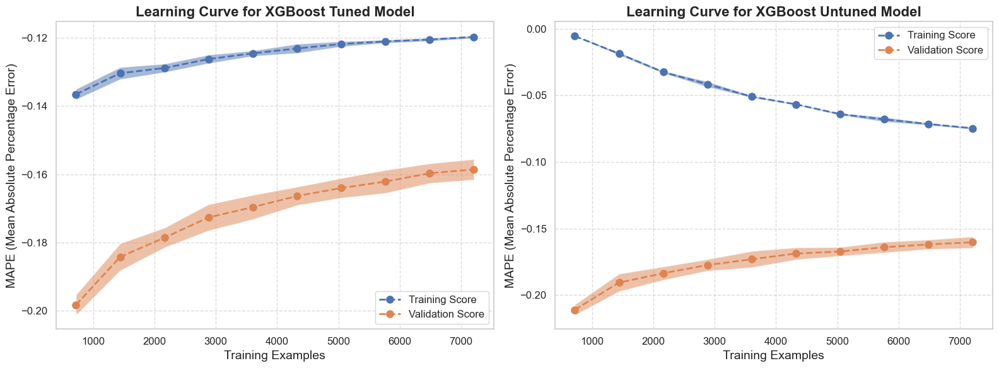

In [932]:
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer
from sklearn.model_selection import LearningCurveDisplay

fig, ax = plt.subplots(1, 2, figsize=(16, 6)) 

# Set the common parameters for both learning curves
common_params = {
    "X": X_train,
    "y": y_train,
    "train_sizes": np.linspace(0.1, 1.0, 10),  
    "cv": 5,
    "scoring": 'neg_mean_absolute_percentage_error',  
    "n_jobs": 4,
    "line_kw": {'marker': 'o', 'markersize': 8, 'linestyle': '--', 'linewidth': 2},  
    "score_type": "both",
}

# Generate learning curve plot for the tuned model
LearningCurveDisplay.from_estimator(xgb_tuned, **common_params, ax=ax[0])

# Set title, labels, and legend for the tuned model
ax[0].set_title('Learning Curve for XGBoost Tuned Model', fontsize=16, fontweight='bold')
ax[0].set_xlabel('Training Examples', fontsize=14)
ax[0].set_ylabel('MAPE (Mean Absolute Percentage Error)', fontsize=14)
ax[0].tick_params(axis='both', which='major', labelsize=12)  # Larger tick labels
handles, labels = ax[0].get_legend_handles_labels()
ax[0].legend(handles[:2], ['Training Score', 'Validation Score'], loc='lower right', fontsize=12)
ax[0].grid(True, linestyle='--', alpha=0.7)

# Generate learning curve plot for the untuned model
LearningCurveDisplay.from_estimator(model1, **common_params, ax=ax[1])

# Set title, labels, and legend for the untuned model
ax[1].set_title('Learning Curve for XGBoost Untuned Model', fontsize=16, fontweight='bold')
ax[1].set_xlabel('Training Examples', fontsize=14)
ax[1].set_ylabel('MAPE (Mean Absolute Percentage Error)', fontsize=14)
ax[1].tick_params(axis='both', which='major', labelsize=12)  # Larger tick labels
handles, labels = ax[1].get_legend_handles_labels()
ax[1].legend(handles[:2], ['Training Score', 'Validation Score'], loc='upper right', fontsize=12)
ax[1].grid(True, linestyle='--', alpha=0.7)

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Pada grafik di sebelah kiri, terlihat bahwa training curve (biru) memiliki error yang lebih rendah dibandingkan dengan validation curve (oranye), tetapi perbedaannya tidak terlalu signifikan. Hal ini menunjukkan bahwa model yang dituning memiliki performa yang lebih baik dalam menyesuaikan data latih tanpa adanya overfitting yang signifikan. Seiring bertambahnya jumlah test set, kesalahan pada set validasi sedikit meningkat namun cenderung stabil, yang mengindikasikan model yang lebih general.
- Pada grafik di sebelah kanan, training curve (biru) menunjukkan error yang jauh lebih rendah dibandingkan dengan validation curve (oranye). Ini adalah tanda overfitting yang cukup jelas, di mana model terlalu mempelajari dengan train set namun tidak dapat menangani data yang belum pernah dilihat dengan baik. Selain itu, kurva validasi menunjukkan tren penurunan kinerja yang lebih tajam, yang menunjukkan bahwa model belum dapat melakukan generalisasi dengan baik pada set validasi.

**LGBM**

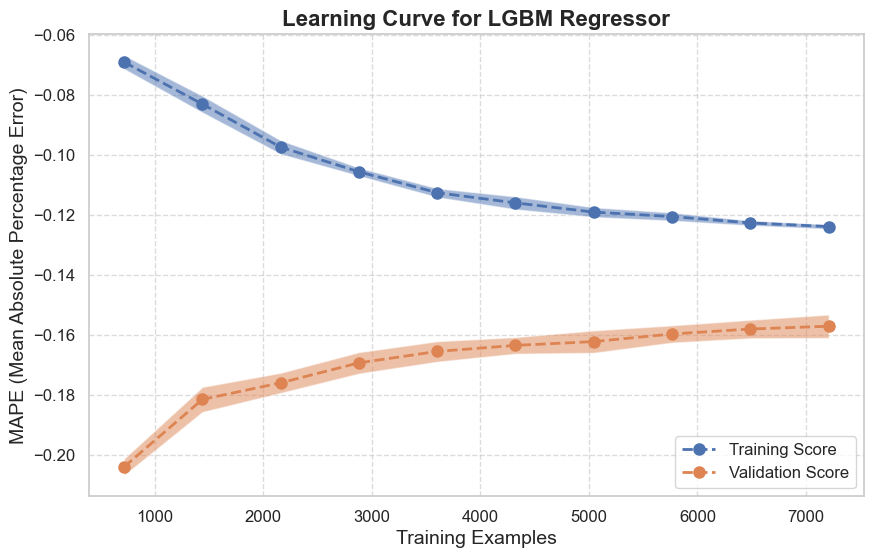

In [930]:
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer
from sklearn.model_selection import LearningCurveDisplay

fig, ax = plt.subplots(figsize=(10, 6))  # Adjusted size for better readability

# Set the required parameters
common_params = {
    "X": X_train,
    "y": y_train,
    "train_sizes": np.linspace(0.1, 1.0, 10),  # Adjust this to the range you need
    "cv": 5,
    "scoring": 'neg_mean_absolute_percentage_error',  # Use MAPE as the scoring metric
    "n_jobs": 4,
    "line_kw": {'marker': 'o', 'markersize': 8, 'linestyle': '--', 'linewidth': 2},  # Larger markers and thicker lines
    "score_type": "both",
}

# Generate learning curve plot
LearningCurveDisplay.from_estimator(lgbm_tuned, **common_params, ax=ax)

# Set title, labels, and legend
ax.set_title('Learning Curve for LGBM Regressor', fontsize=16, fontweight='bold')
ax.set_xlabel('Training Examples', fontsize=14)
ax.set_ylabel('MAPE (Mean Absolute Percentage Error)', fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=12)  # Larger tick labels
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], ['Training Score', 'Validation Score'], loc='lower right', fontsize=12)

# Add grid for better readability
ax.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

Berdasarkan grafik diatas, dapat dilihat meskipun model LGBM menunjukkan beberapa indikasi overfitting, jarak antara training curve dan validasi tidak sebesar model XGBoost. Ini menunjukkan bahwa meskipun ada ruang untuk peningkatan generalisasi, model ini sudah lebih baik dalam menangani data baru.

**Feature Importances**

**XGBoost**

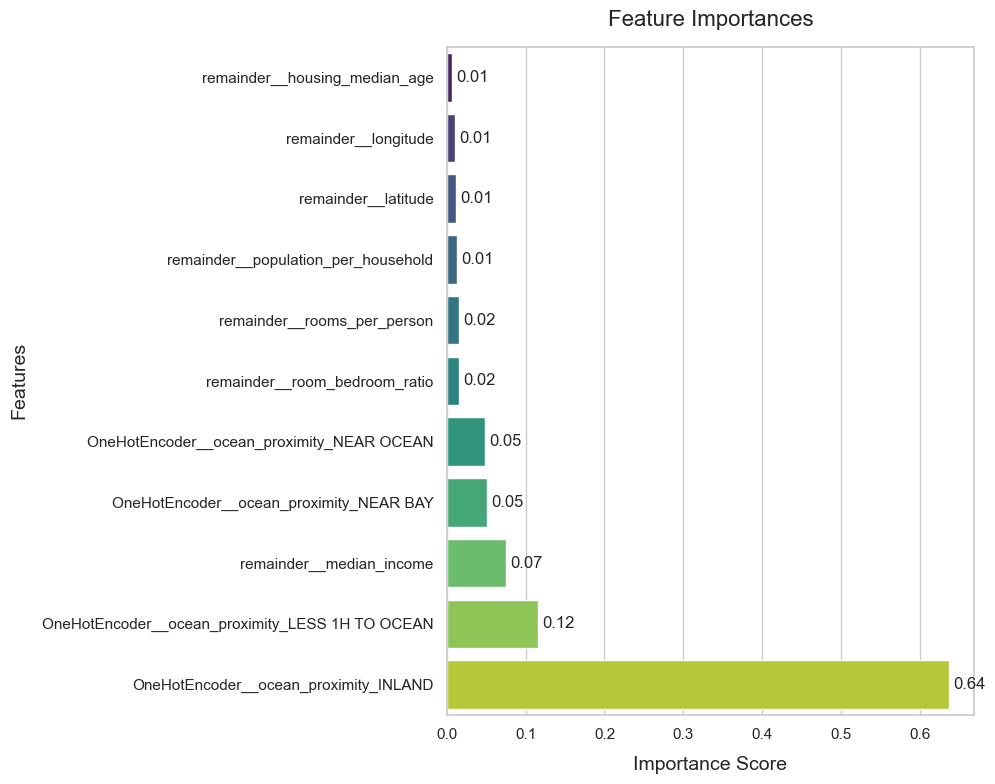

In [933]:
# Access the TransformedTargetRegressor from the pipeline
tuned_ttr = xgb_tuned.named_steps['model']

# Access the XGBoost model from the TransformedTargetRegressor
xgb_model = tuned_ttr.regressor_

# Get feature importances from the XGBoost model
feature_imp = pd.Series(xgb_model.feature_importances_, index=transformer.get_feature_names_out())

# Sort the feature importances
feature_imp = feature_imp.sort_values(ascending=True)

# Set the style and palette
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))

# Plot the feature importances
ax = sns.barplot(x=feature_imp, y=feature_imp.index, palette="viridis")

# Add labels and title
ax.set_title('Feature Importances', fontsize=16, pad=15)
ax.set_xlabel('Importance Score', fontsize=14, labelpad=10)
ax.set_ylabel('Features', fontsize=14, labelpad=10)

# Add value labels to the bars
for i in ax.containers:
    ax.bar_label(i, fmt='%.2f', label_type='edge', fontsize=12, padding=3)

# Improve layout
plt.tight_layout()

# Show the plot
plt.show()

Berdasarkan grafik feature importance XGBoost diatas, didapat insight:
- OneHotEncoder__ocean_proximity_INLAND memiliki nilai importance score tertinggi, yaitu 0,64. Hal oni menunjukkan bahwa lokasi perumahan berada di area INLAND (daratan jauh dari laut) sangat berpengaruh dalam menentukan nilai rumah.
- OneHotEncoder__ocean_proximity_LESS 1H TO OCEAN dan remainder__median_income juga memiliki pengaruh yang signifikan, dengan importance score masing-masing sebesar 0,12 dan 0,07. Faktor ini menandakan bahwa kedekatan properti dengan laut serta pendapatan median di area tersebut merupakan faktor penting dalam memprediksi nilai rumah.
- Remainder features seperti housing_median_age, longitude, latitude, dan lain-lain memiliki nilai importance score yang rendah (semua di bawah 0,05). Hal ini menunjukkan bahwa walaupun faktor-faktor ini masih memberikan kontribusi, pengaruhnya terhadap prediksi nilai rumah jauh lebih kecil dibandingkan dengan variabel utama seperti ocean_proximity dan median_income.

Secara keseluruhan, Model XGBoost sangat bergantung pada fitur yang terkait dengan lokasi geografis relatif terhadap laut dan faktor pendapatan.

**LGBM**

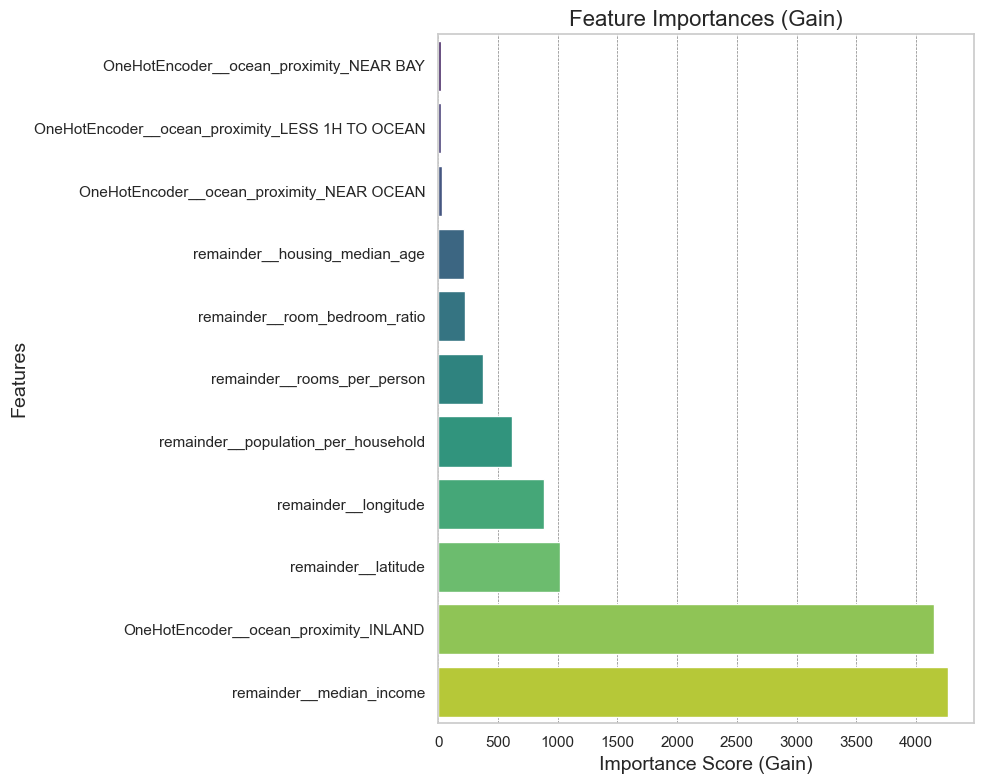

In [953]:
# Access the TransformedTargetRegressor from the pipeline
tuned_ttr = lgbm_tuned.named_steps['model']

# Access the LGBM model from the TransformedTargetRegressor
lgbm_model = tuned_ttr.regressor_

# Get feature importances based on 'gain' from the LGBM model
feature_imp = pd.Series(lgbm_model.booster_.feature_importance(importance_type='gain'), 
                        index=transformer.get_feature_names_out())

# Sort feature importances
feature_imp = feature_imp.sort_values(ascending=True)

# Create the plot
plt.figure(figsize=(10, 8))
sns.barplot(x=feature_imp, y=feature_imp.index, palette='viridis')

# Add title and labels
plt.title('Feature Importances (Gain)', fontsize=16)
plt.xlabel('Importance Score (Gain)', fontsize=14)
plt.ylabel('Features', fontsize=14)

# Customize the plot
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', axis='x')
plt.tight_layout()

# Show the plot
plt.show()

Berdasarkan grafik feature importance LGBM di atas, didapatkan beberapa insight:
- Fitur median_income dan ocean_proximity_INLAND adalah dua fitur paling signifikan dalam memprediksi nilai median rumah. Hal ini menunjukkan bahwa pendapatan rata-rata dan kedekatan dengan daerah yang tidak berdekatan dengan laut adalah faktor utama dalam menentukan harga rumah. Artinya, area yang jauh dari laut cenderung memiliki nilai rumah yang lebih rendah atau beragam tergantung pada faktor-faktor lain.
- Fitur lain seperti latitude, longitude, dan population_per_household juga menunjukkan pentingnya, meskipun kontribusinya lebih rendah dibandingkan fitur utama. Ini menandakan bahwa selain faktor pendapatan dan lokasi spesifik di daratan, faktor-faktor demografis seperti kepadatan populasi per rumah tangga juga memengaruhi nilai rumah, meskipun tidak sekuat faktor pendapatan.

**Model Performance vs Prediction**

**XGBoost**

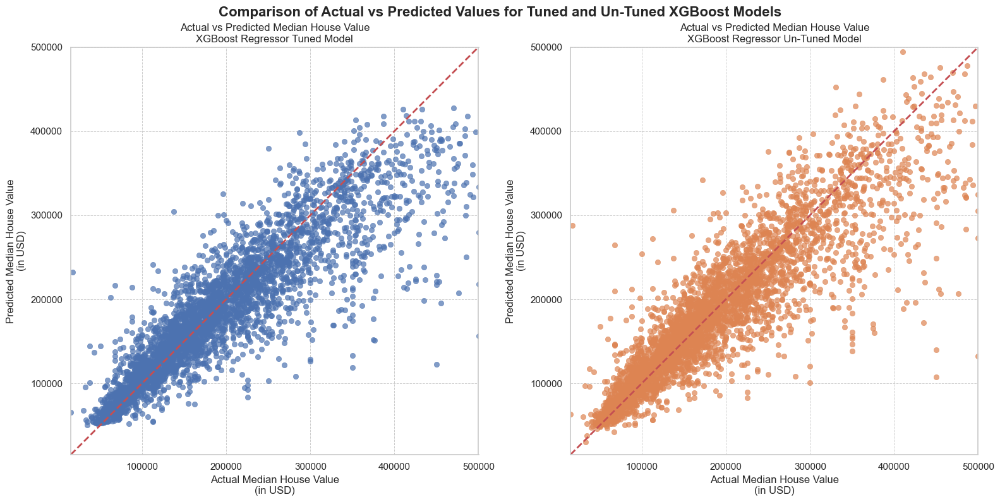

In [906]:
sns.set_theme(style="whitegrid")

# Create the subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Define the limits for the x and y axes based on the combined range of actual and predicted values
lims = [
    min(y_test.min(), xgb_tuned.predict(X_test).min(), model1.predict(X_test).min()), 
    max(y_test.max(), xgb_tuned.predict(X_test).max(), model1.predict(X_test).max())
]

# Tuned model plot
sns.scatterplot(
    x=y_test,
    y=xgb_tuned.predict(X_test),
    ax=axes[0],
    color='#4c72b0',  # Nice blue color
    alpha=0.7,
    edgecolor=None
)

axes[0].plot(lims, lims, 'r--', linewidth=2)  # Add 45-degree line with thicker line
axes[0].set_xlim(lims)
axes[0].set_ylim(lims)
axes[0].set_aspect('equal', 'box')
axes[0].grid(True, linestyle='--', linewidth=0.7)

axes[0].set(
    xlabel='Actual Median House Value\n(in USD)',
    ylabel='Predicted Median House Value\n(in USD)',
    title='Actual vs Predicted Median House Value\nXGBoost Regressor Tuned Model',
    xlim=lims,
    ylim=lims
)

# Benchmark model plot
sns.scatterplot(
    x=y_test,
    y=model1.predict(X_test),
    ax=axes[1],
    color='#dd8452',  # Nice orange color
    alpha=0.7,
    edgecolor=None
)

axes[1].plot(lims, lims, 'r--', linewidth=2)  # Add 45-degree line with thicker line
axes[1].set_xlim(lims)
axes[1].set_ylim(lims)
axes[1].set_aspect('equal', 'box')
axes[1].grid(True, linestyle='--', linewidth=0.7)

axes[1].set(
    xlabel='Actual Median House Value\n(in USD)',
    ylabel='Predicted Median House Value\n(in USD)',
    title='Actual vs Predicted Median House Value\nXGBoost Regressor Un-Tuned Model',
    xlim=lims,
    ylim=lims
)

# Adjust the layout
plt.tight_layout()

# Add a super title for the entire figure
plt.suptitle('Comparison of Actual vs Predicted Values for Tuned and Un-Tuned XGBoost Models', fontsize=16, fontweight='bold')

# Adjust the super title positioning
plt.subplots_adjust(top=0.92)

# Show the plot
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Grafik actual vs predicted untuk XGBoost yang telah di tuning memiliki hasil yang akurat pada nilai rumah di range bawah atau rendah meskipun pada nilai rumah yang besar masih ditemui banyak error/menyimpang

**LGBM**

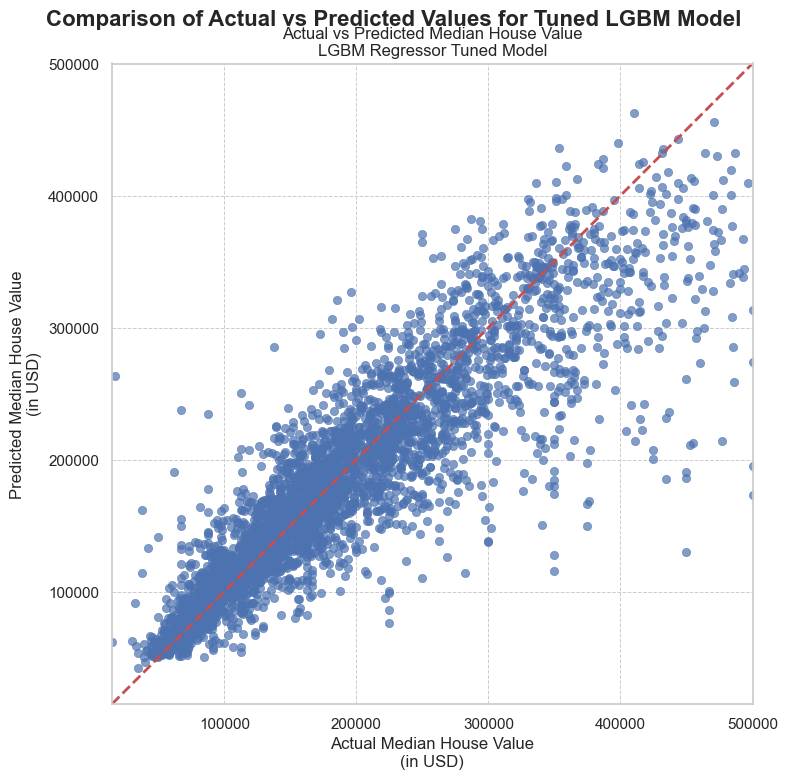

In [939]:
fig, ax = plt.subplots(figsize=(8, 8))

# Define the limits for the x and y axes based on the range of actual and predicted values
lims = [
    min(y_test.min(), lgbm_tuned.predict(X_test).min()), 
    max(y_test.max(), lgbm_tuned.predict(X_test).max())
]

# Plot for the tuned/best LGBM model
sns.scatterplot(
    x=y_test,
    y=lgbm_tuned.predict(X_test),
    ax=ax,
    color='#4c72b0',  # Nice blue color
    alpha=0.7,
    edgecolor=None
)

# Add 45-degree line with a thicker line
ax.plot(lims, lims, 'r--', linewidth=2)
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_aspect('equal', 'box')
ax.grid(True, linestyle='--', linewidth=0.7)

ax.set(
    xlabel='Actual Median House Value\n(in USD)',
    ylabel='Predicted Median House Value\n(in USD)',
    title='Actual vs Predicted Median House Value\nLGBM Regressor Tuned Model',
    xlim=lims,
    ylim=lims
)

# Adjust the layout
plt.tight_layout()

# Add a title for the entire figure
plt.suptitle('Comparison of Actual vs Predicted Values for Tuned LGBM Model', fontsize=16, fontweight='bold')

# Adjust the title positioning
plt.subplots_adjust(top=0.92)

# Show the plot
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Grafik actual vs predicted untuk LGBM memiliki hasil yang akurat pada nilai rumah di range bawah atau rendah meskipun pada nilai rumah yang besar masih ditemui banyak error/menyimpang

**Residual Plot**

**XGBoost**

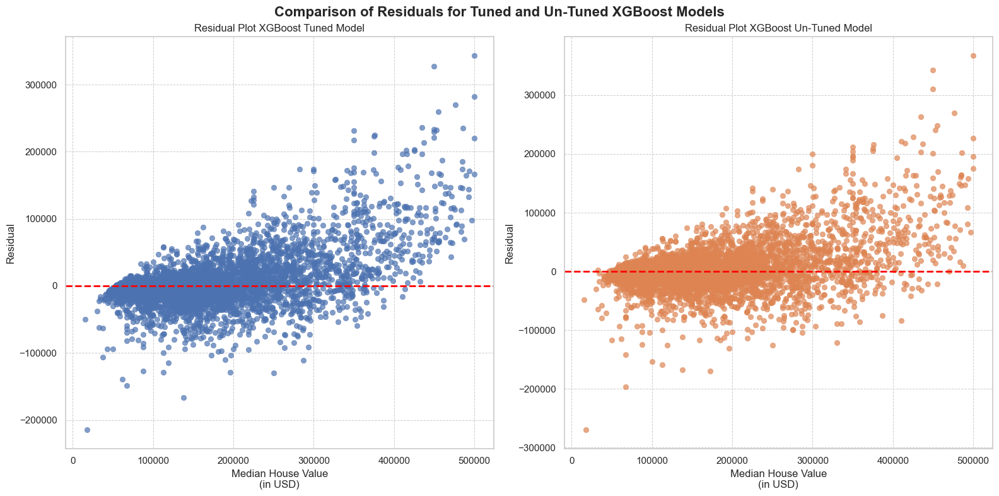

In [908]:
residual_benchmark = y_test - model1.predict(X_test)
residual_tuned = y_test - xgb_tuned.predict(X_test)

# Set the Seaborn theme for better aesthetics
sns.set_theme(style="whitegrid")

# Create the subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Tuned model residual plot
sns.scatterplot(
    x=y_test,
    y=residual_tuned,
    ax=axes[0],
    color='#4c72b0',  # Nice blue color
    alpha=0.7,
    edgecolor=None
)

axes[0].axhline(0, color='red', linestyle='--', linewidth=2)  # Add horizontal line at y=0
axes[0].grid(True, linestyle='--', linewidth=0.7)
axes[0].set(
    xlabel='Median House Value\n(in USD)',
    ylabel='Residual',
    title='Residual Plot XGBoost Tuned Model'
)

# Benchmark model residual plot
sns.scatterplot(
    x=y_test,
    y=residual_benchmark,
    ax=axes[1],
    color='#dd8452',  # Nice orange color
    alpha=0.7,
    edgecolor=None
)

axes[1].axhline(0, color='red', linestyle='--', linewidth=2)  # Add horizontal line at y=0
axes[1].grid(True, linestyle='--', linewidth=0.7)
axes[1].set(
    xlabel='Median House Value\n(in USD)',
    ylabel='Residual',
    title='Residual Plot XGBoost Un-Tuned Model'
)

# Adjust the layout
plt.tight_layout()

# Add a super title for the entire figure
plt.suptitle('Comparison of Residuals for Tuned and Un-Tuned XGBoost Models', fontsize=16, fontweight='bold')

# Adjust the super title positioning
plt.subplots_adjust(top=0.92)

# Show the plot
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Residual pada model XGBoost yang sudah dituning lebih terkumpul di sekitar garis nol, menunjukkan prediksi yang lebih akurat dan sedikit bias. Namun, masih ada beberapa penyebaran terutama pada nilai rumah yang lebih tinggi, yang menunjukkan adanya variabilitas yang perlu diperbaiki.

**LGBM**

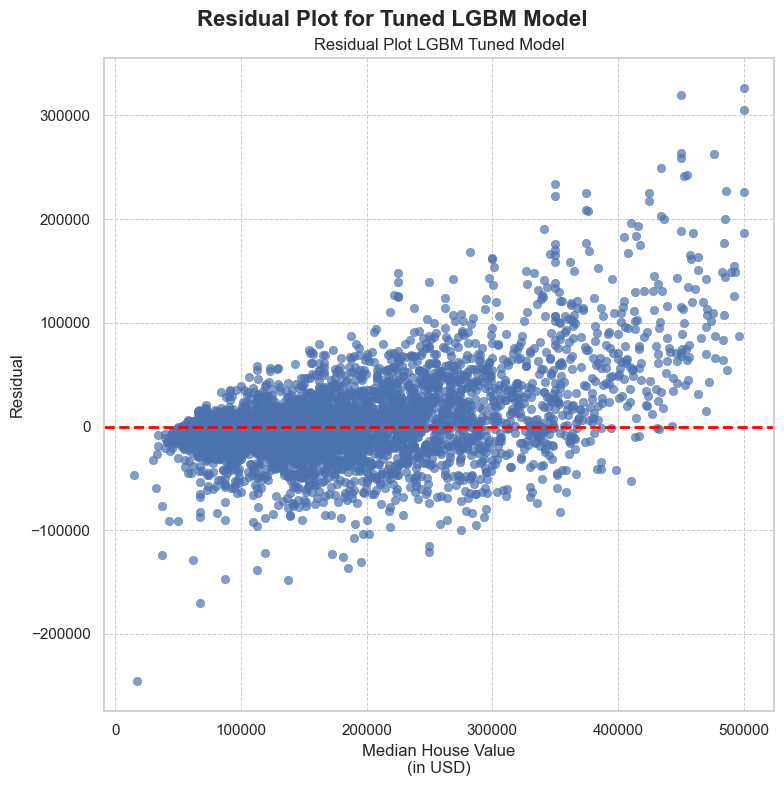

In [940]:
residual_tuned = y_test - lgbm_tuned.predict(X_test)

# Set the Seaborn theme for better aesthetics
sns.set_theme(style="whitegrid")

# Create the plot
fig, ax = plt.subplots(figsize=(8, 8))

# Tuned model residual plot
sns.scatterplot(
    x=y_test,
    y=residual_tuned,
    color='#4c72b0',  # Nice blue color
    alpha=0.7,
    edgecolor=None,
    ax=ax
)

ax.axhline(0, color='red', linestyle='--', linewidth=2)  # Add horizontal line at y=0
ax.grid(True, linestyle='--', linewidth=0.7)
ax.set(
    xlabel='Median House Value\n(in USD)',
    ylabel='Residual',
    title='Residual Plot LGBM Tuned Model'
)

# Adjust the layout
plt.tight_layout()

# Add a super title for the entire figure
plt.suptitle('Residual Plot for Tuned LGBM Model', fontsize=16, fontweight='bold')

# Adjust the super title positioning
plt.subplots_adjust(top=0.92)

# Show the plot
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Residual pada model LGBM cenderung terkumpul di sekitar garis nol, menunjukkan prediksi yang lebih akurat dan sedikit bias. Namun, masih ada beberapa penyebaran terutama pada nilai rumah yang lebih tinggi, yang menunjukkan adanya variabilitas yang perlu diperbaiki.

**MAE dan MAPE tiap interval `median_house_value`**

Akan dibentuk binning untuk `median_house_value`

In [910]:
data_bin = data.copy()

# Membuat bin eq
data_bin['median_house_value_eqin'] = pd.cut(data_bin['median_house_value'], 10)
data_bin['median_house_value_eqin_num'] = pd.cut(data_bin['median_house_value'], 10, labels=range(1,11))

# Membuat bin eqfreq
data_bin['median_house_value_eqfreq'] = pd.qcut(data_bin['median_house_value'], 10)
data_bin['median_house_value_eqfreq_num'] = pd.qcut(data_bin['median_house_value'], 10, labels=range(1,11))

In [911]:
data_bin['median_house_value_eqfreq'].value_counts()

median_house_value_eqfreq
(80300.0, 103100.0]     1292
(14998.999, 80300.0]    1290
(171550.0, 195000.0]    1289
(195000.0, 225900.0]    1288
(332790.0, 500000.0]    1288
(264880.0, 332790.0]    1287
(151700.0, 171550.0]    1286
(103100.0, 128100.0]    1285
(225900.0, 264880.0]    1284
(128100.0, 151700.0]    1283
Name: count, dtype: int64

**XGBoost**

In [912]:
data_count = pd.DataFrame({'Actual Count': y_test, 'Predicted Count': xgb_tuned.predict(X_test)})

data80k = data_count[data_count['Actual Count'] <= 80300.0]
data103k = data_count[(data_count['Actual Count'] > 80300.0) & (data_count['Actual Count'] <= 103100.0)]
data128k = data_count[(data_count['Actual Count'] > 103100.0) & (data_count['Actual Count'] <= 128100.0)]
data151k = data_count[(data_count['Actual Count'] > 128100.0) & (data_count['Actual Count'] <= 151700.0)]
data171k = data_count[(data_count['Actual Count'] > 151700.0) & (data_count['Actual Count'] <= 171550.0)]
data195k = data_count[(data_count['Actual Count'] > 171550.0) & (data_count['Actual Count'] <= 195000.0)]
data225k = data_count[(data_count['Actual Count'] > 195000.0) & (data_count['Actual Count'] <= 225900.0)]
data264k = data_count[(data_count['Actual Count'] > 225900.0) & (data_count['Actual Count'] <= 264880.0)]
data332k = data_count[(data_count['Actual Count'] > 264880.0) & (data_count['Actual Count'] <= 332790.0)]
data332kmore = data_count[(data_count['Actual Count'] > 332790.0)]

target_list = [data80k, data103k, data128k, data151k, data171k, data195k, data225k, data264k, data332k, data332kmore]
index_list = ['<=80K', '80K-103K', '103K-128K' ,'128K-151K', '151K-171K', '171K-195K', '195K-225K', '225K-264K', '264K-332K', '>332K']
mae_xgb = []
mape_xgb = []
counts = []

for i in target_list:
    mae_xgb.append(mean_absolute_error(i['Actual Count'], i['Predicted Count']))
    mape_xgb.append(mean_absolute_percentage_error(i['Actual Count'], i['Predicted Count']))
    counts.append(i.shape[0])

bin_metrics_xgb = pd.DataFrame({
    'MAE': mae_xgb,
    'MAPE': mape_xgb,
    'Count': counts
}, index=index_list)

<Figure size 2400x800 with 0 Axes>

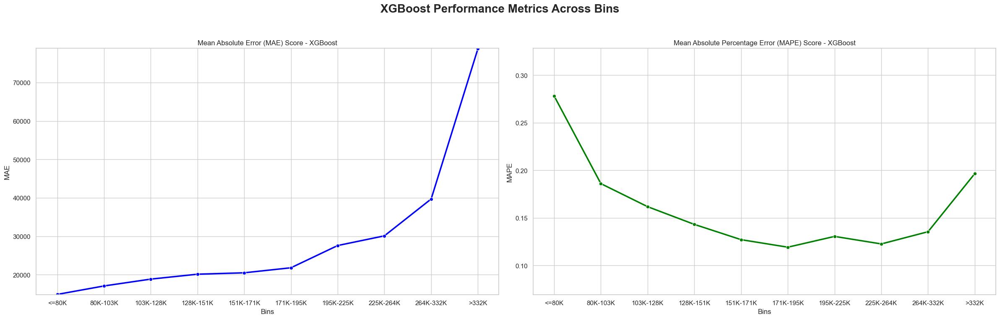

In [941]:
plt.figure(figsize=(24, 8))

# Create subplots with consistent styling
fig, axes = plt.subplots(1, 2, figsize=(24, 8))

# Plot for MAE
sns.lineplot(
    data=bin_metrics_xgb,
    x=bin_metrics_xgb.index,
    y='MAE',
    ax=axes[0],
    marker='o',
    color='blue',
    linewidth=2.5
)
axes[0].set(
    title='Mean Absolute Error (MAE) Score - XGBoost',
    xlabel='Bins',
    ylabel='MAE',
    ylim=(bin_metrics_xgb['MAE'].min() - 100, bin_metrics_xgb['MAE'].max() + 100)
)
axes[0].grid(True)

# Plot for MAPE
sns.lineplot(
    data=bin_metrics_xgb,
    x=bin_metrics_xgb.index,
    y='MAPE',
    ax=axes[1],
    marker='o',
    color='green',
    linewidth=2.5
)
axes[1].set(
    title='Mean Absolute Percentage Error (MAPE) Score - XGBoost',
    xlabel='Bins',
    ylabel='MAPE',
    ylim=(bin_metrics_xgb['MAPE'].min() - 0.05, bin_metrics_xgb['MAPE'].max() + 0.05)
)
axes[1].grid(True)

# Main title for the figure
fig.suptitle('XGBoost Performance Metrics Across Bins', fontsize=20, fontweight='bold')

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Display the plots
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Nilai MAE cendering meningkat seiring dengan meningkatnya nilai rumah. Hal ini menandakan bahwa model memiliki kesulitan dalam memprediksi nilai rumah yang lebih tinggi
- Nilai MAPE memiliki kecenderungan yang lebih rendah pada rentang harga rumah di tengah dan nilai MAPE yang tinggi pada range atas dan bawah pada nilai rumah

**LGBM**

In [914]:
data_count = pd.DataFrame({'Actual Count': y_test, 'Predicted Count': lgbm_tuned.predict(X_test)})

data80k = data_count[data_count['Actual Count'] <= 80300.0]
data103k = data_count[(data_count['Actual Count'] > 80300.0) & (data_count['Actual Count'] <= 103100.0)]
data128k = data_count[(data_count['Actual Count'] > 103100.0) & (data_count['Actual Count'] <= 128100.0)]
data151k = data_count[(data_count['Actual Count'] > 128100.0) & (data_count['Actual Count'] <= 151700.0)]
data171k = data_count[(data_count['Actual Count'] > 151700.0) & (data_count['Actual Count'] <= 171550.0)]
data195k = data_count[(data_count['Actual Count'] > 171550.0) & (data_count['Actual Count'] <= 195000.0)]
data225k = data_count[(data_count['Actual Count'] > 195000.0) & (data_count['Actual Count'] <= 225900.0)]
data264k = data_count[(data_count['Actual Count'] > 225900.0) & (data_count['Actual Count'] <= 264880.0)]
data332k = data_count[(data_count['Actual Count'] > 264880.0) & (data_count['Actual Count'] <= 332790.0)]
data332kmore = data_count[(data_count['Actual Count'] > 332790.0)]

target_list = [data80k, data103k, data128k, data151k, data171k, data195k, data225k, data264k, data332k, data332kmore]
index_list = ['<=80K', '80K-103K', '103K-128K' ,'128K-151K', '151K-171K', '171K-195K', '195K-225K', '225K-264K', '264K-332K', '>332K']
mae_lgbm = []
mape_lgbm = []
counts = []

for i in target_list:
    mae_lgbm.append(mean_absolute_error(i['Actual Count'], i['Predicted Count']))
    mape_lgbm.append(mean_absolute_percentage_error(i['Actual Count'], i['Predicted Count']))
    counts.append(i.shape[0])

bin_metrics_lgbm = pd.DataFrame({
    'MAE': mae_lgbm,
    'MAPE': mape_lgbm,
    'Count': counts
}, index=index_list)

<Figure size 2400x800 with 0 Axes>

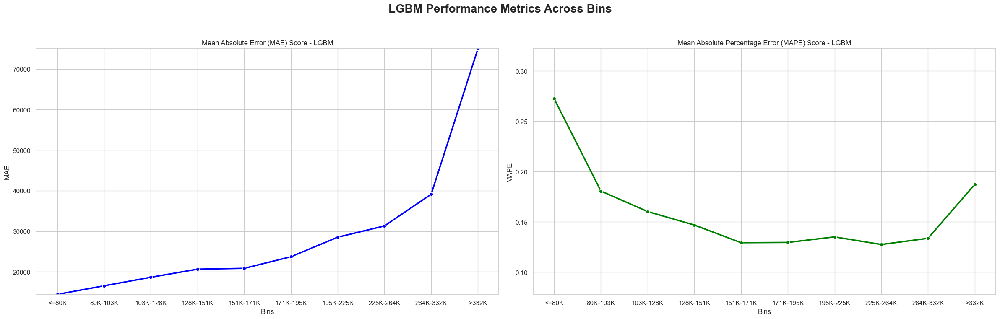

In [942]:
plt.figure(figsize=(24, 8))

# Create subplots with consistent styling
fig, axes = plt.subplots(1, 2, figsize=(24, 8))

# Plot for MAE
sns.lineplot(
    data=bin_metrics_lgbm,
    x=bin_metrics_lgbm.index,
    y='MAE',
    ax=axes[0],
    marker='o',
    color='blue',
    linewidth=2.5
)
axes[0].set(
    title='Mean Absolute Error (MAE) Score - LGBM',
    xlabel='Bins',
    ylabel='MAE',
    ylim=(bin_metrics_lgbm['MAE'].min() - 100, bin_metrics_lgbm['MAE'].max() + 100)
)
axes[0].grid(True)

# Plot for MAPE
sns.lineplot(
    data=bin_metrics_lgbm,
    x=bin_metrics_lgbm.index,
    y='MAPE',
    ax=axes[1],
    marker='o',
    color='green',
    linewidth=2.5
)
axes[1].set(
    title='Mean Absolute Percentage Error (MAPE) Score - LGBM',
    xlabel='Bins',
    ylabel='MAPE',
    ylim=(bin_metrics_lgbm['MAPE'].min() - 0.05, bin_metrics_lgbm['MAPE'].max() + 0.05)
)
axes[1].grid(True)

# Main title for the figure
fig.suptitle('LGBM Performance Metrics Across Bins', fontsize=20, fontweight='bold')

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Display the plots
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Nilai MAE cendering meningkat seiring dengan meningkatnya nilai rumah. Hal ini menandakan bahwa model memiliki kesulitan dalam memprediksi nilai rumah yang lebih tinggi
- Nilai MAPE memiliki kecenderungan yang lebih rendah pada rentang harga rumah di tengah dan nilai MAPE yang tinggi pada range atas dan bawah pada nilai rumah

**Mix Plot**

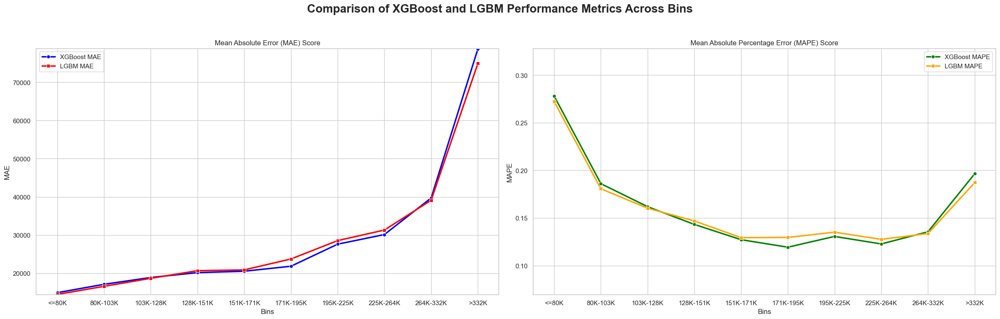

In [916]:
fig, axes = plt.subplots(1, 2, figsize=(24, 8))

# Plot for MAE
sns.lineplot(
    data=bin_metrics_xgb,
    x=bin_metrics_xgb.index,
    y='MAE',
    ax=axes[0],
    marker='o',
    color='blue',
    linewidth=2.5,
    label='XGBoost MAE'
)
sns.lineplot(
    data=bin_metrics_lgbm,
    x=bin_metrics_lgbm.index,
    y='MAE',
    ax=axes[0],
    marker='s',
    color='red',
    linewidth=2.5,
    label='LGBM MAE'
)
axes[0].set(
    title='Mean Absolute Error (MAE) Score',
    xlabel='Bins',
    ylabel='MAE',
    ylim=(min(bin_metrics_xgb['MAE'].min(), bin_metrics_lgbm['MAE'].min()) - 100,
          max(bin_metrics_xgb['MAE'].max(), bin_metrics_lgbm['MAE'].max()) + 100)
)
axes[0].grid(True)
axes[0].legend()

# Plot for MAPE
sns.lineplot(
    data=bin_metrics_xgb,
    x=bin_metrics_xgb.index,
    y='MAPE',
    ax=axes[1],
    marker='o',
    color='green',
    linewidth=2.5,
    label='XGBoost MAPE'
)
sns.lineplot(
    data=bin_metrics_lgbm,
    x=bin_metrics_lgbm.index,
    y='MAPE',
    ax=axes[1],
    marker='s',
    color='orange',
    linewidth=2.5,
    label='LGBM MAPE'
)
axes[1].set(
    title='Mean Absolute Percentage Error (MAPE) Score',
    xlabel='Bins',
    ylabel='MAPE',
    ylim=(min(bin_metrics_xgb['MAPE'].min(), bin_metrics_lgbm['MAPE'].min()) - 0.05,
          max(bin_metrics_xgb['MAPE'].max(), bin_metrics_lgbm['MAPE'].max()) + 0.05)
)
axes[1].grid(True)
axes[1].legend()

# Main title for the figure
fig.suptitle('Comparison of XGBoost and LGBM Performance Metrics Across Bins', fontsize=20, fontweight='bold')

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Display the plots
plt.show()

Berdasarkan grafik diatas, dapat dilihat kedua model memiliki nilai MAE dan MAPE yang cenderung sama untuk tiap-tiap range nilai rumah

**Line Plot**

**XGBoost**

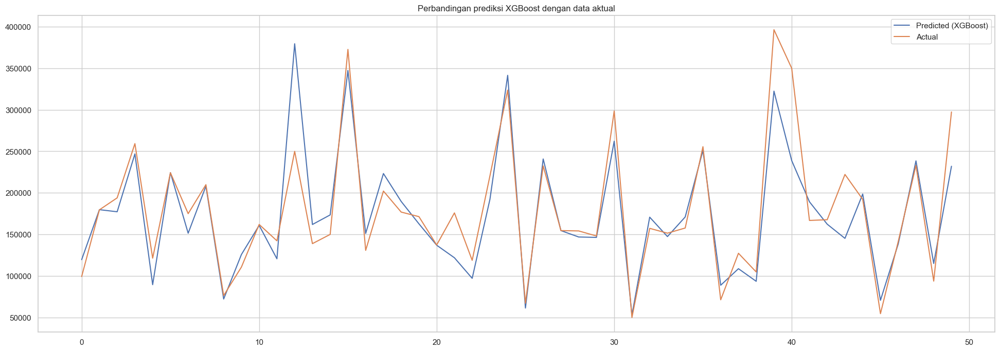

In [917]:
line_xgb = pd.DataFrame({
    'Predict XGB': xgb_tuned.predict(X_test),
    'Actual': y_test
})
line_xgb = line_xgb.reset_index()
line_xgb = line_xgb.drop(['index'], axis=1)
fig = plt.figure(figsize=(24,8))
plt.plot(line_xgb[:50])
plt.title('Perbandingan prediksi XGBoost dengan data aktual')
plt.legend(['Predicted (XGBoost)', 'Actual'])

plt.show()


**LGBM**

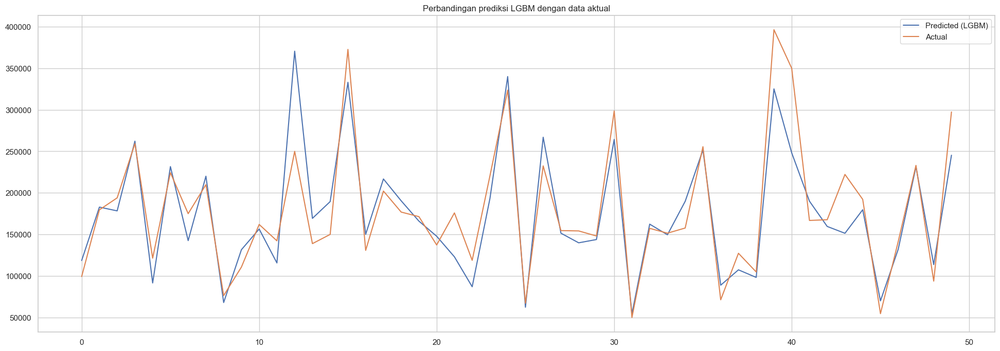

In [918]:
line_lgbm = pd.DataFrame({
    'Predict lgbm': lgbm_tuned.predict(X_test),
    'Actual': y_test
})
line_lgbm = line_lgbm.reset_index()
line_lgbm = line_lgbm.drop(['index'], axis=1)
fig = plt.figure(figsize=(24,8))
plt.plot(line_lgbm[:50])
plt.title('Perbandingan prediksi LGBM dengan data aktual')
plt.legend(['Predicted (LGBM)', 'Actual'])

plt.show()

**Mix Plot**

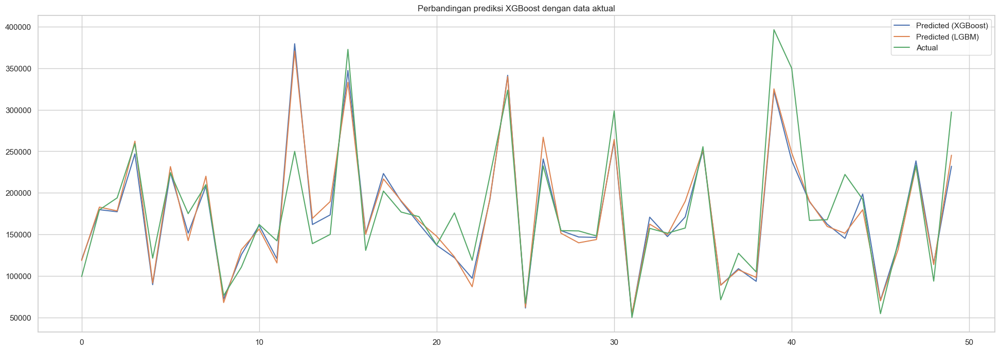

In [919]:
line_mix = pd.DataFrame({
    'Predict XGB': xgb_tuned.predict(X_test),
    'Predict lgbm': lgbm_tuned.predict(X_test),
    'Actual': y_test
})
line_mix = line_mix.reset_index()
line_mix = line_mix.drop(['index'], axis=1)
fig = plt.figure(figsize=(24,8))
plt.plot(line_mix[:50])
plt.title('Perbandingan prediksi XGBoost dengan data aktual')
plt.legend(['Predicted (XGBoost)', 'Predicted (LGBM)','Actual'])

plt.show()

Dari grafik diatas, dapat dilihat bahwa baik model XGBoost maupun LGBM mengikuti tren data aktual dengan cukup baik. Kedua model mampu memprediksi puncak dan lembah dalam data dengan akurasi yang cukup tinggi, meskipun terdapat beberapa titik di mana prediksi sedikit meleset dari nilai aktual. Dapat dilihat pada bagian nomor 40, model gagal memprediksi nilai rumah pada nilai yang tinggi.

**Best Model**

Berdasarkan analisis yang telah dilakukan diatas, dipilih LGBM sebagai best model

**Ocean Proximity Analysis**

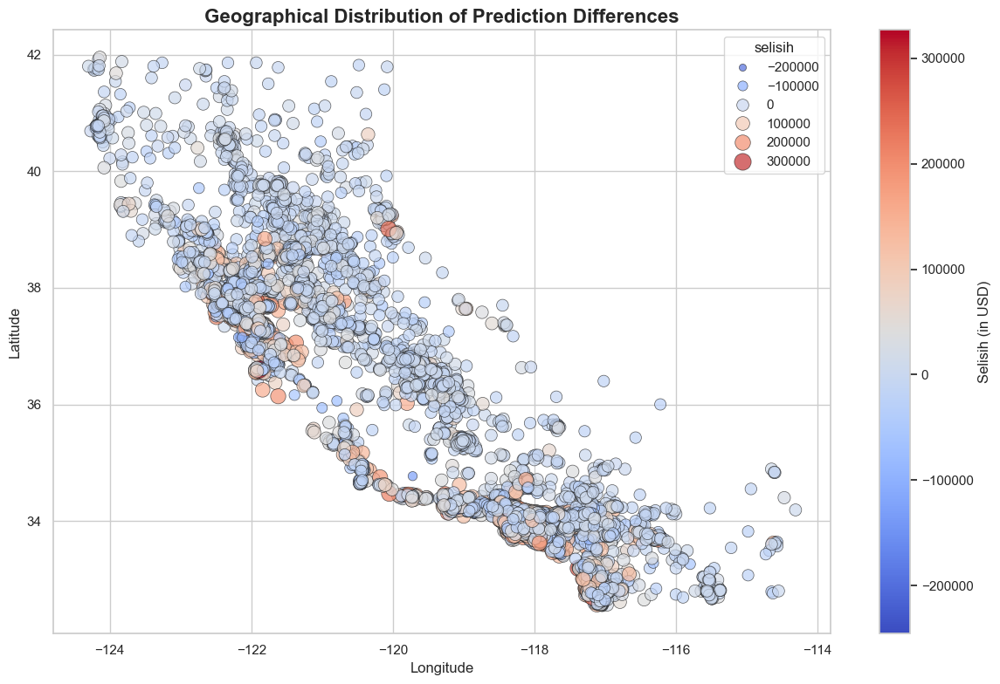

In [944]:
plt.figure(figsize=(12, 8))

# Scatter plot with enhanced visuals
scatter = sns.scatterplot(
    data=data_selisih,
    x='longitude',
    y='latitude',
    hue='selisih',
    palette='coolwarm',  # Choose a diverging palette to highlight differences
    size='selisih',
    sizes=(20, 200),
    alpha=0.7,
    edgecolor='k',  # Add a black edge color to the points
    linewidth=0.5
)

# Add color bar for hue
norm = plt.Normalize(data_selisih['selisih'].min(), data_selisih['selisih'].max())
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=scatter, orientation="vertical", label="Selisih (in USD)")

# Add title and labels
plt.title('Geographical Distribution of Prediction Differences', fontsize=16, fontweight='bold')
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

# Adjust the layout for better presentation
plt.tight_layout()

# Show the plot
plt.show()

Berdasarkan grafik diatas, didapat insight:
- Prediksi model cenderung lebih akurat di area yang lebih jauh dari laut, seperti wilayah INLAND.
- Di daerah yang lebih dekat dengan laut, seperti LESS 1H TO OCEAN dan NEAR OCEAN, kita melihat adanya kesalahan prediksi yang lebih besar. Area-area ini menunjukkan perbedaan prediksi yang lebih signifikan, dengan banyak rumah yang diprediksi memiliki nilai lebih tinggi atau lebih rendah secara drastis dibandingkan dengan nilai aktualnya

**Model Limitations**

Model terbaik yang dipilih adalah LGBM. Model ini memiliki beberapa limitasi yaitu:
- Model hanya dapat digunakan pada `longitude` antara -124.3 hingga -114.31.
- Model hanya dapat digunakan pada `latitude` antara 32.54 hingga 41.95.
- Model hanya dapat digunakan pada `housing_median_age` antara 1 hingga 51 tahun.
- Model hanya dapat digunakan pada `median_income` antara 0.4999 hingga 15.0001.
- Model hanya dapat digunakan pada `rooms_per_person` antara 0.008576 hingga 55.222222.
- Model hanya dapat digunakan pada `room_bedroom_ratio` antara 1.000000 hingga 10.000000.
- Model hanya dapat digunakan pada `population_per_household` antara 0.750000 hingga 599.714286.
- Model hanya dapat digunakan pada `median_house_value` antara 14999 hingga 500000 USD.

---
### **7.** ***CONCLUSION AND RECOMMENDATION***

#### **1. Conclusion**
Berdasarkan hasil pemodelan terbaik (**LGBM**):
1. Dari kombinasi model yang dibuat dan dua model yang dituning, didapat model **LGBM** memiliki performa yang paling baik pada dataset ini dengan nilai MAE sebesar 29026 USD dan MAPE sebesar 15.9%. Nilai tersebut sebenarnya masih bisa dioptimasi namun menimbang potensi overfitting yang menjadi trade offnya, dirasa model tersebut sudah memiliki performa yang seimbang.
1. Model memiliki performa yang optimal dalam memprediksi nilai rumah yang rendah (dibawah 195K USD) dan performa mulai buruk diatas nilai tersebut

#### **2. Recommendation**
Untuk bisnis:
- Untuk memaksimalkan keuntungan, perlu disesuaikan tempat rumah tersebut dibangun. Serta memperhatikan pendapatan orang-orang pada warga sekitar daerah tersebut (Bisa dilihat dari pendapatan perkapita).

Untuk model machine learning:
- Bisa dilakukan optimasi menggunakan GridSearch. Kemudian hyperparameter tuning perlu diperhatikan lebih detail dikarenakan trade off nya dengan potensi overfitting
- Evaluasi feature masih bisa dilakukan dengan lanjut, misal dengan penerapan PCA

Untuk dataset:
- Perlu ditambahkan beberapa fitur yang berkorelasi lebih tinggi terhadap target, misal luas bangunan, luas tanah, dan lain-lain

#### **3. Save Model**

In [957]:
import pickle

estimator = lgbm_tuned
estimator.fit(X, y)

pickle.dump(estimator, open('CaliforniaHousingPriceEstimator-TauffanRizky.sav', 'wb'))

In [958]:
filename = 'CaliforniaHousingPriceEstimator-TauffanRizky.sav'
loaded_model = pickle.load(open(filename,'rb'))